# **1 - Loading Prerequisites**

In [1]:
import sqlite3
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from sklearn.impute import KNNImputer
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder
from math import ceil
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN, estimate_bandwidth
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.base import clone
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV
from collections import Counter
from sklearn import metrics
from sklearn.model_selection import ParameterGrid
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.manifold import TSNE
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.model_selection import train_test_split
import graphviz


sns.set()

In [2]:
## Allow Colab to see Google Drive files

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
## Load csv file into a dataframe
## Paste the path here
data_path = "/content/drive/MyDrive/Machine Learning Projects/WonderfulWinesWorld.csv"

df = pd.read_csv(data_path)

# Read the CSV file with the correct delimiter
df = pd.read_csv('/content/drive/MyDrive/Machine Learning Projects/WonderfulWinesWorld.csv', delimiter=';')

df_center=df.copy()

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# **METADATA**



*   *CUSTID* - customer ID number
*   *DAYSWUS* - number of days as a customer
*   *AGE* - customer's age
*   *EDUCATION* - years of education
*   *INCOME* - household income
*   *KIDHOME* - 1=has child under 13 yo living at home
*   *TEENHOME* - 1=has teen (13 to 19 yo) living at home
*   *FREQ* - number of purchases in past 18 months
*   *RECENCY* - number of days since last purchase
*   *MONETARY* - total sales to this person in past 18 months
*   *LTV* - customer lifetime value
*   *PERDEAL* - % purchases bought on discount (units)
*   *DRYRED* - % of wines that were dry red wines
*   *SWEETRED* - % of wines that were sweet red wines
*   *DRYWH* - % of wines that were dry white wines
*   *SWEETWH* - % of wines that were sweet white wines
*   *DESSERT* - % of wines that were dessert wines (port, sherry, etc.)
*   *EXOTIC* - % of wines that were exotic wines
*   *WEBPURCH* - % of purchases made on website/app
*   *WEBVISIT* - average number of visits to website/app per month
*   *ACCESS* - number of accessories bought in past 18 months







In [ ]:
# Look at the header columns of the initial dataframe, and the first 5 rows
df.head(5)

,Custid,Dayswus,Age,Educ,Income,Kidhome,Teenhome,Freq,Recency,Monetary,...,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,WebVisit,Access
0,1001,789,68,16,90782,0,0,29,66,1402,...,3,37,5,44,10,3,2,19,4,1
1,1002,623,78,20,113023,0,0,31,6,1537,...,1,55,1,38,4,2,2,9,1,0
2,1003,583,24,18,28344,1,0,4,69,44,...,66,32,19,24,1,24,63,59,7,1
3,1004,893,59,19,93571,0,1,21,10,888,...,12,60,10,19,6,5,15,35,5,0
4,1005,1062,59,18,91852,0,1,25,26,1138,...,5,59,5,28,4,4,19,34,6,0


In [ ]:
# Look at the dataset types
df.dtypes

Custid         int64
Dayswus        int64
Age            int64
Educ           int64
Income         int64
Kidhome        int64
Teenhome       int64
Freq           int64
Recency        int64
Monetary       int64
LTV            int64
Perdeal        int64
Dryred         int64
Sweetred       int64
Drywh          int64
Sweetwh        int64
Dessert        int64
Exotic         int64
WebPurchase    int64
WebVisit       int64
Access         int64
dtype: object

In [ ]:
# As we can see, "Kidhome" and "Teenhome" are booleans. Fix wrong data type for these columns.
df.Kidhome = df.Kidhome.astype("boolean")
df.Teenhome = df.Teenhome.astype("boolean")
df.dtypes

Custid           int64
Dayswus          int64
Age              int64
Educ             int64
Income           int64
Kidhome        boolean
Teenhome       boolean
Freq             int64
Recency          int64
Monetary         int64
LTV              int64
Perdeal          int64
Dryred           int64
Sweetred         int64
Drywh            int64
Sweetwh          int64
Dessert          int64
Exotic           int64
WebPurchase      int64
WebVisit         int64
Access           int64
dtype: object

In [ ]:
# count of unique values
df.nunique()


Custid         10000
Dayswus          701
Age               61
Educ               9
Income          9458
Kidhome            2
Teenhome           2
Freq              54
Recency          389
Monetary         722
LTV             1208
Perdeal           98
Dryred            99
Sweetred          59
Drywh             73
Sweetwh           59
Dessert           59
Exotic            97
WebPurchase       82
WebVisit          11
Access             4
dtype: int64

In [ ]:
# count of missing values
df.isna().sum()

Custid         0
Dayswus        0
Age            0
Educ           0
Income         0
Kidhome        0
Teenhome       0
Freq           0
Recency        0
Monetary       0
LTV            0
Perdeal        0
Dryred         0
Sweetred       0
Drywh          0
Sweetwh        0
Dessert        0
Exotic         0
WebPurchase    0
WebVisit       0
Access         0
dtype: int64

In [ ]:
# Check for duplicate rows
df.duplicated().sum()

0

In [ ]:
# Check descriptive statistics
df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Custid,10000.0,NaN,NaN,NaN,6000.5,2886.89568,1001.0,3500.75,6000.5,8500.25,11000.0
Dayswus,10000.0,NaN,NaN,NaN,898.102,202.492789,550.0,723.75,894.0,1074.0,1250.0
Age,10000.0,NaN,NaN,NaN,47.9273,17.302721,18.0,33.0,48.0,63.0,78.0
Educ,10000.0,NaN,NaN,NaN,16.7391,1.876375,12.0,15.0,17.0,18.0,20.0
Income,10000.0,NaN,NaN,NaN,69904.358,27612.233311,10000.0,47642.0,70012.0,92147.0,140628.0
Kidhome,10000,2,False,5812,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Teenhome,10000,2,False,5302,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Freq,10000.0,NaN,NaN,NaN,14.6281,11.969073,1.0,4.0,12.0,24.0,56.0
Recency,10000.0,NaN,NaN,NaN,62.4068,69.874255,0.0,26.0,52.0,78.25,549.0
Monetary,10000.0,NaN,NaN,NaN,622.5552,647.135323,6.0,63.0,383.0,1077.0,3052.0


# COMMENTS


*   The dataset contains no N/A values, indicating that no data modification is required.

*   There are no redundant rows, thus there are none to remove.

*   Booleans were defined as Kidhome and Teenhome.

*   The CustomerID feature was identified as the dataframe's index.

*   Investigating the many outliers and contradictions is necessary.




#**Metric Definition**

In [ ]:
df.set_index('Custid', inplace=True)

In [ ]:
# Define metric and non-metric features.
non_metric_features = ["Kidhome", "Teenhome"]
metric_features = ['Dayswus', 'Age', 'Educ', 'Income', 'Freq', 'Recency', 'Monetary', 'LTV', 'Perdeal', 'Dryred', 'Sweetred', 'Drywh', 'Sweetwh', 'Dessert', 'Exotic', 'WebPurchase', 'WebVisit', 'Access']

# Create the dataframes with the different variables associated to the problem statements before described
df_mf = df[metric_features]

# **VISUAL EXPLORATION**

In [ ]:
## Define a function that plots multiple histograms

def plot_multiple_histograms(data, feats, title="Variables' Histograms"):

    # Prepare figure. Create individual axes where each histogram will be placed
    fig, axes = plt.subplots(2, ceil(len(feats) / 2), figsize=(35, 10))

    # Plot data
    # Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
    for ax, feat in zip(axes.flatten(), feats): # Notice the zip() function and flatten() method
      ax.hist(data[feat])
      ax.set_title(feat)

    # Layout
    # Add a centered title to the figure:
    plt.suptitle(title)

    plt.show()

    return

    ## Define a function that plots multiple box plots

def plot_multiple_boxplots(data, feats, title="Numeric Variables' Box Plots"):

    # Prepare figure. Create individual axes where each histogram will be placed
    fig, axes = plt.subplots(2, ceil(len(feats) / 2), figsize=(35, 10))

    # Plot data
    # Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
    for ax, feat in zip(axes.flatten(), feats): # Notice the zip() function and flatten() method
      sns.boxplot(x=data[feat], ax=ax)
      ax.set_title(feat)

    # Layout
    # Add a centered title to the figure:
    plt.suptitle(title)

    plt.show()

    return

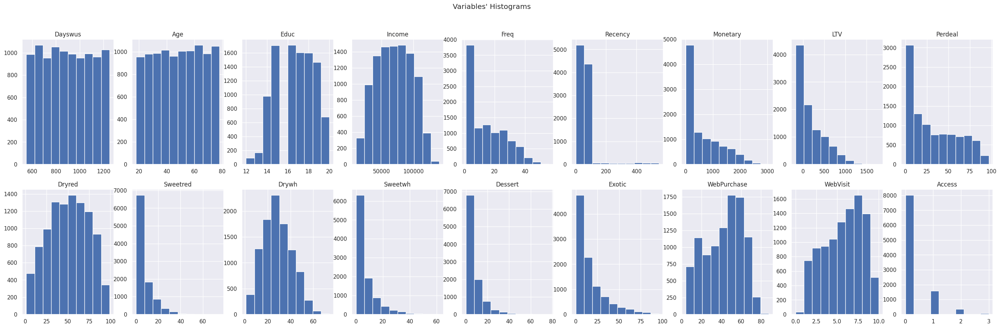

In [ ]:
# All variable's Histograms in one figure

plot_multiple_histograms(df_mf, metric_features)

We can see from the histogram plot which variables have a normal distribution, which is left skewed, and which ones have a right skewed distribution.
The removal of outliers and subsequent evaluations of the data will both benefit from this information.

array([[<Axes: title={'center': 'Access'}>]], dtype=object)

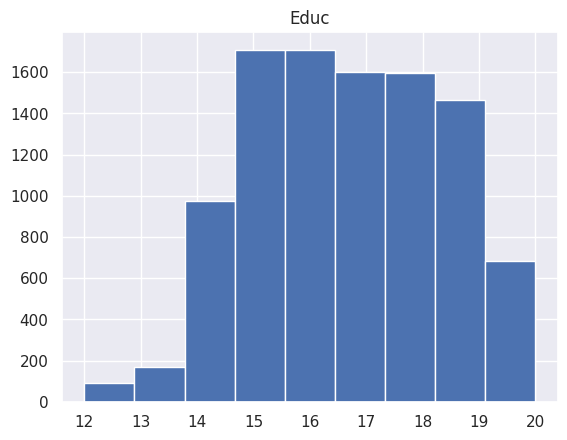

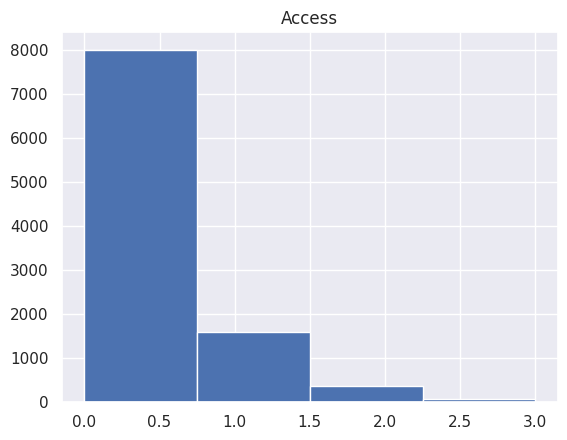

In [ ]:
# Histograms for Educ and Access
df_mf.hist('Educ', bins=9)
df_mf.hist('Access', bins=4)

<Axes: xlabel='Kidhome', ylabel='count'>

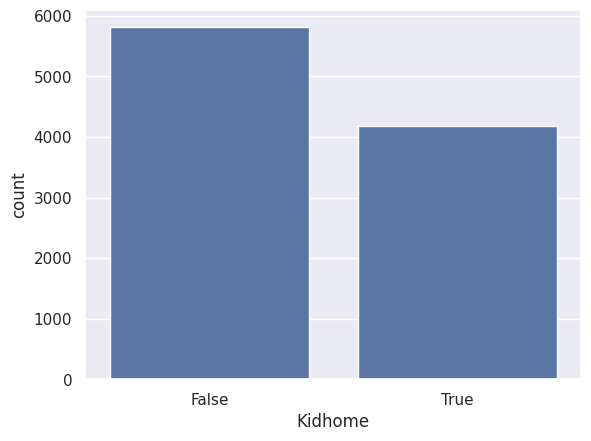

In [ ]:
# Kidhome - countplot as being boolean
sns.countplot(x=df['Kidhome'])

<Axes: xlabel='Teenhome', ylabel='count'>

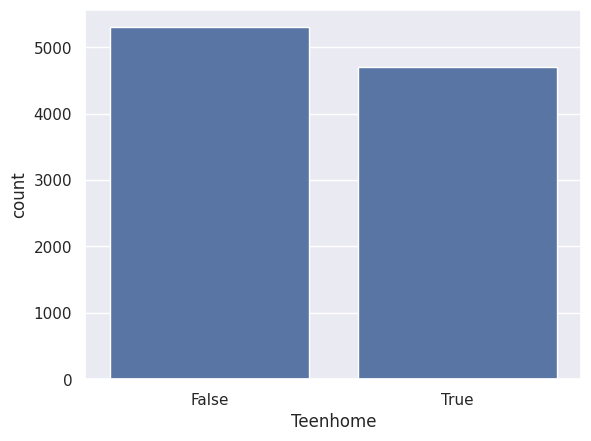

In [ ]:
# Teenhome - countplot as being boolean
sns.countplot(x=df['Teenhome'])

# **Boxplots**

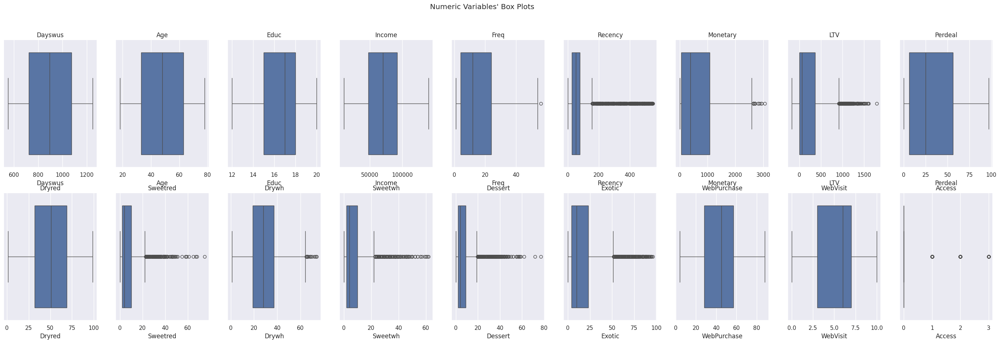

In [ ]:
# Multiple boxplots plotted
plot_multiple_boxplots(df_mf, metric_features)

In [ ]:
# For a better understanding of the "Access" feature, we count the unique values available. In the plot is hard to understand it perfectly

df_mf.value_counts('Access')

Access
0    8009
1    1579
2     355
3      57
dtype: int64

In the boxplots we can verify that exist some outliers in the distribution of the different features that need to be removed.

# Outlier Removal - Manual

- df_mf_outlierm = original
- df_mf_outlieriqr = the iqr method
- df_mf_outlierm = outlier removal and substitution

In [ ]:
# By observing the graphics, we decided to approach the outlier removal from the boxplo analysis.

outliers1 = (
    (df_mf['Recency']<=350)
    &
    (df_mf['Monetary']<=2750)
    &
    (df_mf['LTV']<=1500)
    &
    (df_mf['Sweetred']<=50)
    &
    (df_mf['Drywh']<=70)
    &
    (df_mf['Sweetwh']<=50)
    &
    (df_mf['Dessert']<=45)
    &
    (df_mf['Exotic']<=75)
)

df_mf_outlierm = df_mf[outliers1]

print('Percentage of data kept after removing outliers', np.round(df_mf_outlierm.shape[0] / df_center.shape[0],4))

Percentage of data kept after removing outliers 0.962


Based on the analysis of the boxplot and the identified outliers in the dataframe, we proceed to the removal of some of those outliers.

In the end we are excluding almost 4% of the entire population in the outlier removal.

# **Outlier Removal - IQR**





In [ ]:
for column in df_mf.columns:
  #Calculate Q1, Q3 and the IQR (Q3-Q1) for the column
  Q1 = df_mf[column].quantile(0.25)
  Q3 = df_mf[column].quantile(0.75)
  IQR = Q3 - Q1

  # Determine the inner and outer fences for the column
  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR

  # Remove rows with values that fall outside the bounds

  df_mf_outlieriqr = df_mf[(df_mf[column] >= lower_bound) & (df_mf[column] <= upper_bound)]

  # The dataframe now contains only rows with values within the bounds for all columns

print('Percentage of data kept after removing outliers:', np.round(df_mf_outlieriqr.shape[0] / df_center.shape[0], 4))

Percentage of data kept after removing outliers: 0.8009


In [ ]:
# Plot the IQR table
df_mf_outlieriqr

,Dayswus,Age,Educ,Income,Freq,Recency,Monetary,LTV,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,WebVisit,Access
Custid,,,,,,,,,,,,,,,,,,
1002,623,78,20,113023,31,6,1537,565,1,55,1,38,4,2,2,9,1,0
1004,893,59,19,93571,21,10,888,207,12,60,10,19,6,5,15,35,5,0
1005,1062,59,18,91852,25,26,1138,355,5,59,5,28,4,4,19,34,6,0
1007,1120,45,17,69485,11,73,345,-45,61,71,7,13,1,8,3,46,7,0
1008,658,54,18,68602,2,44,41,9,15,84,1,12,2,0,3,37,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10994,1194,54,14,94367,21,1,896,329,10,68,5,21,3,4,38,55,7,0
10995,1025,39,15,58121,4,6,61,-8,66,53,6,28,7,6,9,71,8,0
10996,967,28,17,54292,23,72,1011,436,7,41,11,36,1,11,42,31,6,0


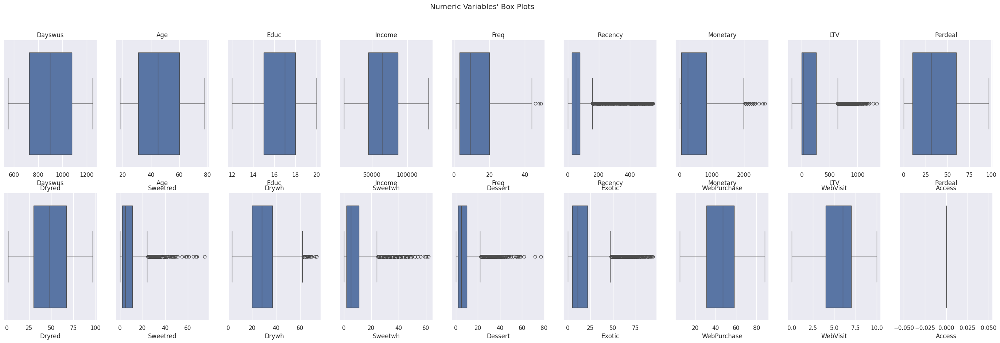

In [ ]:
plot_multiple_boxplots(df_mf_outlieriqr , metric_features)

# Outlier Removal - KNN


In [ ]:
# Standardize the data
scaler = StandardScaler()
df_mf_scaled = scaler.fit_transform(df_mf)

# Set the number of neighbors (k)
k = 3
knn_model = NearestNeighbors(n_neighbors=k)
knn_model.fit(df_mf_scaled)

# Find distances and indices of k-neighbors for each data point
distances, indices = knn_model.kneighbors(df_mf_scaled)

# Set a threshold for outlier detection
threshold = 2.3

# Identify outlier indices
outlier_indices = np.where(distances > threshold)[0]

# Remove outliers from the original DataFrame
df_cleaned_data = df_mf.drop(df_mf.index[outlier_indices], axis=0)



total_data_points = len(df_center)
num_outliers_removed = len(outlier_indices)

# Calculate the percentage of outliers removed
percentage_outliers_removed = (- (df_cleaned_data.shape[0] - df_center.shape[0])/ df_center.shape[0])*100

# Print the results
print(f"Number of outliers removed: {num_outliers_removed}")
print(f"Percentage of outliers removed: {percentage_outliers_removed:.2f}%")
print('Percentage of data kept after removing outliers:', np.round(df_cleaned_data.shape[0] / df_center.shape[0], 4))

Number of outliers removed: 789
Percentage of outliers removed: 4.98%
Percentage of data kept after removing outliers: 0.9502


# Outlier Removal & Substitution

In [ ]:
# Regarding the interpretations before, we have decided to approach the outlier removal from the boxplot analysis.

outliers3 = (
    (df_mf['Monetary']<=2500)
    &
    (df_mf['Sweetred']<=40)
    &
    (df_mf['Drywh']<=65)
    &
    (df_mf['Sweetwh']<=35)
    &
    (df_mf['Dessert']<=35)
)

df_mf_outlierm = df_mf[outliers3]

total_data_points = len(df_mf)
num_outliers3_removed = len(df_mf)-len(df_mf_outlierm)

# Calculate the percentage of outliers removed
percentage_outliers3_removed = (num_outliers3_removed / df_center.shape[0]) * 100

# Print the results
print(f"Number of outliers removed: {num_outliers3_removed}")
print(f"Percentage of outliers removed: {percentage_outliers3_removed:.2f}%")
print('Percentage of data kept after removing outliers:', np.round(df_mf_outlierm.shape[0] / total_data_points, 4))

Number of outliers removed: 334
Percentage of outliers removed: 3.34%
Percentage of data kept after removing outliers: 0.9666


In [ ]:
# All the values for Recency above 180, were changed to the limit of 150
rcn_t = df_mf_outlierm['Recency'].copy()
rcn_t.loc[rcn_t>150] = 150
print(rcn_t[rcn_t == 180].count())
df_mf_outlierm['Recency'] = rcn_t

0


<ipython-input-26-5902ed522691>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_mf_outlierm['Recency'] = rcn_t


In [ ]:
# All the values for LTV above 900, were changed to the limit of 900
ltv_t = df_mf_outlierm['LTV'].copy()
ltv_t.loc[ltv_t>900] = 900
print(ltv_t[ltv_t == 900].count())
df_mf_outlierm['LTV'] = ltv_t

309


<ipython-input-27-870d4b75baff>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_mf_outlierm['LTV'] = ltv_t


In [ ]:
print(df_mf_outlierm['Recency'].max())
print(df_mf_outlierm['LTV'].max())

150
900


In [ ]:
print('Percentage of data kept after removing outliers:', np.round(df_mf_outlierm.shape[0] / df_center.shape[0], 4))

Percentage of data kept after removing outliers: 0.9666


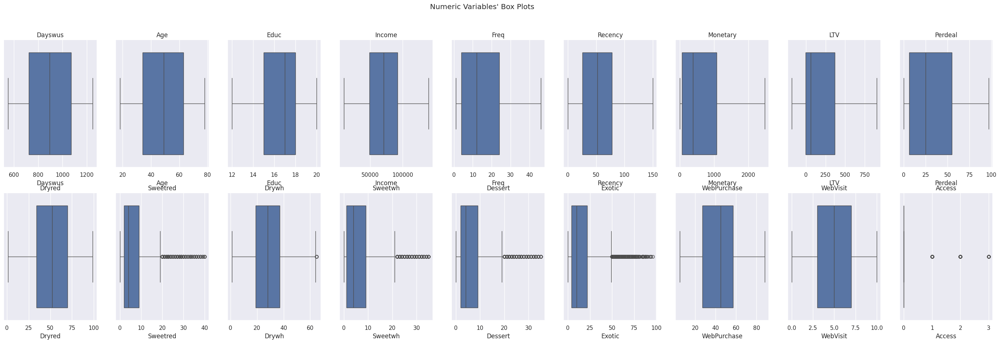

In [ ]:
plot_multiple_boxplots(df_mf_outlierm, metric_features)

# Pairwise Relationship

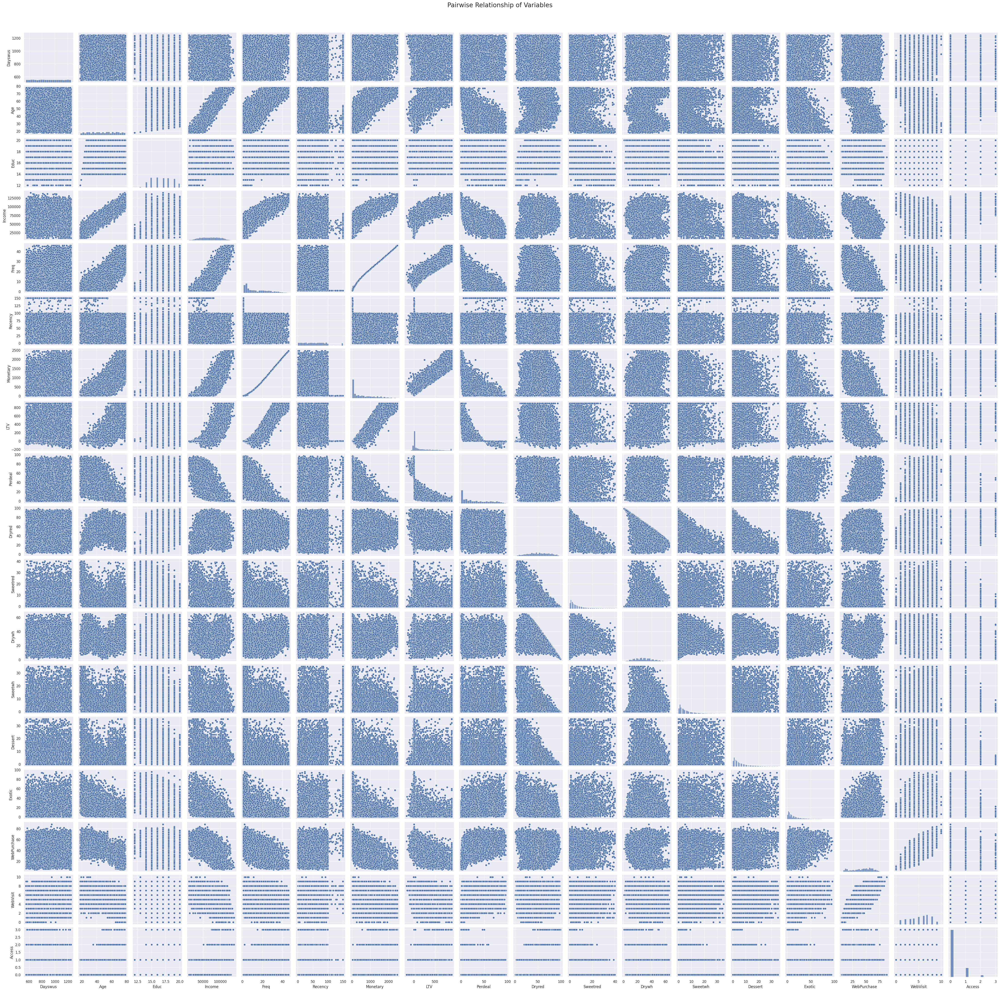

In [ ]:
# Pairwise Relationship of All Numerical Variables
sns.set()

# Setting pairplot
sns.pairplot(df_mf_outlierm, diag_kind="hist")

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Variables", fontsize=20)

plt.show()

# Correlation & Inconsistencies

Inconsistencies Check

To spot discrepancies, it's important to check if the different features in the dataset make sense when considered together. The overall reliability of the combined features listed below is vital:

- WebPurchase and WebVisit - Purchasing on the web requires a prior visit; therefore, the presence of a purchase implies a preceding web visit.
- Age and Education - The recency value should not exceed the number of days since the last purchase, as this would imply recent activity for someone who hasn't made a purchase yet.
- Recency and Dayswus - The recency value should not exceed the number of days since the first purchase, as this would imply recent activity for someone who hasn't made a purchase yet.
- Zero values for features where the value does not make sense to be possible as being zero, as Age, Freq and others



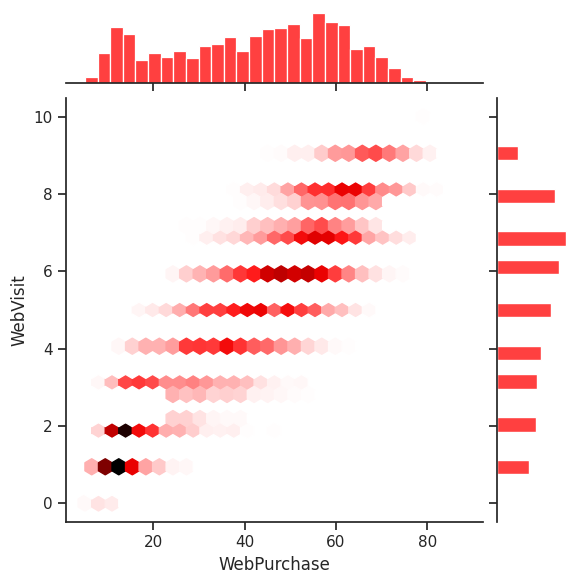

In [ ]:
## Addressing Web visit and Web purchase coherence
sns.set(style="ticks")
sns.jointplot(data=df_mf_outlierm, x="WebPurchase", y="WebVisit", kind="hex", color="red")
plt.show()

In [ ]:
df_mf_outlierm[(df_mf_outlierm['WebVisit']==0) & (df_mf_outlierm['WebPurchase']>0)].value_counts(['WebPurchase','WebVisit'])

WebPurchase  WebVisit
10           0           7
7            0           6
9            0           5
8            0           4
6            0           3
11           0           3
5            0           1
12           0           1
dtype: int64

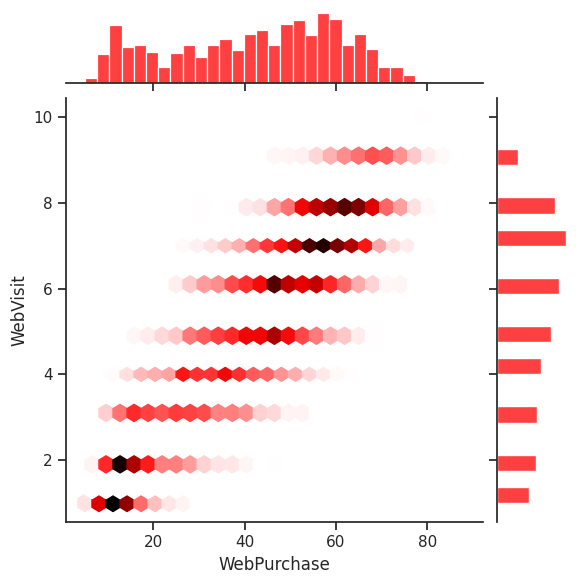

In [ ]:
# Cleaning inconsistencies

# Drop WebVisit values of zero with WebPurchase above zero
df_mf_outlierm_incon = df_mf_outlierm.drop(df_mf_outlierm[df_mf_outlierm['WebVisit']==0].index)

# We can confirm that that we no longer have zero values for Webvisit
sns.set(style="ticks")
sns.jointplot(data=df_mf_outlierm_incon, x = "WebPurchase", y = "WebVisit", kind = "hex", color = "red")
plt.show()

In [ ]:
# Validating last comentary. Confirmed, no inconsistencies.
df_mf_outlierm_incon[(df_mf_outlierm_incon['WebVisit']== 0) & (df_mf_outlierm_incon['WebPurchase']>0)].value_counts(['WebPurchase','WebVisit'])

Series([], dtype: int64)

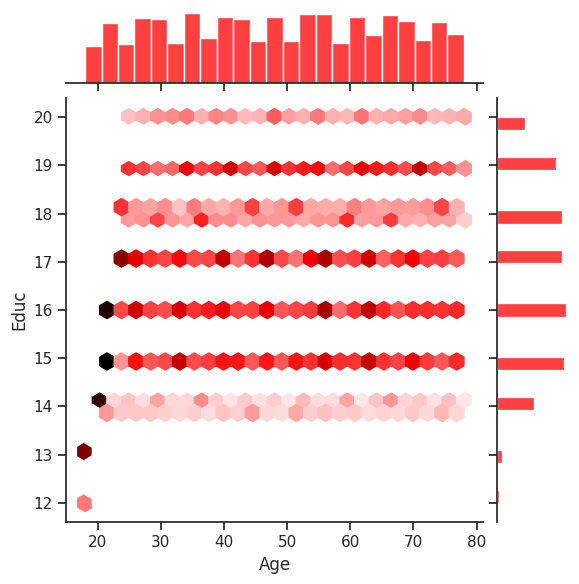

In [ ]:
## Addressing Age and Educ coherence
sns.set(style="ticks")
sns.jointplot(data=df_mf_outlierm, x="Age", y="Educ", kind="hex", color="red")
plt.show()

In [ ]:
# Checking if there are inconcistensies between Educ and Age. The difference between Age and Educ can not be lower than 6.
df_mf_outlierm_incon[(df_mf_outlierm_incon['Age']-df_mf_outlierm_incon['Educ'])<6].value_counts(['Age','Educ'])

Series([], dtype: int64)

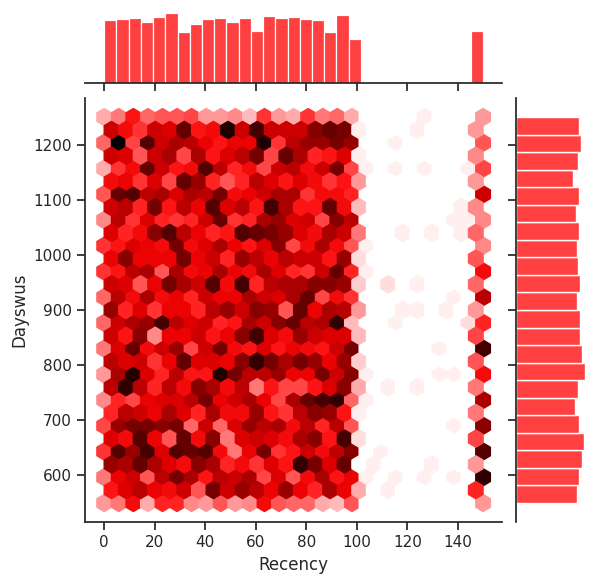

In [ ]:
## Addressing Web visit and Web purchase coherence
sns.set(style="ticks")
sns.jointplot(data=df_mf_outlierm_incon, x="Recency", y="Dayswus", kind="hex", color="red")
plt.show()

In [ ]:
# Confirming there is no inconsistencies
df_mf_outlierm_incon[(df_mf_outlierm_incon['Recency']>df_mf_outlierm_incon['Dayswus']) & (df_mf_outlierm_incon['Recency']>0)].value_counts(['Recency','Dayswus'])

Series([], dtype: int64)

As we can see we don't have any inconsistensies between Recency and Dayswus

## Overall Correlation

In [ ]:
df_mf_outlierm_incon

,Dayswus,Age,Educ,Income,Freq,Recency,Monetary,LTV,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,WebVisit,Access
Custid,,,,,,,,,,,,,,,,,,
1001,789,68,16,90782,29,66,1402,699,3,37,5,44,10,3,2,19,4,1
1002,623,78,20,113023,31,6,1537,565,1,55,1,38,4,2,2,9,1,0
1003,583,24,18,28344,4,69,44,-3,66,32,19,24,1,24,63,59,7,1
1004,893,59,19,93571,21,10,888,207,12,60,10,19,6,5,15,35,5,0
1005,1062,59,18,91852,25,26,1138,355,5,59,5,28,4,4,19,34,6,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10995,1025,39,15,58121,4,6,61,-8,66,53,6,28,7,6,9,71,8,0
10996,967,28,17,54292,23,72,1011,436,7,41,11,36,1,11,42,31,6,0
10997,637,76,15,125962,33,75,1668,476,3,61,2,25,5,6,1,45,5,2


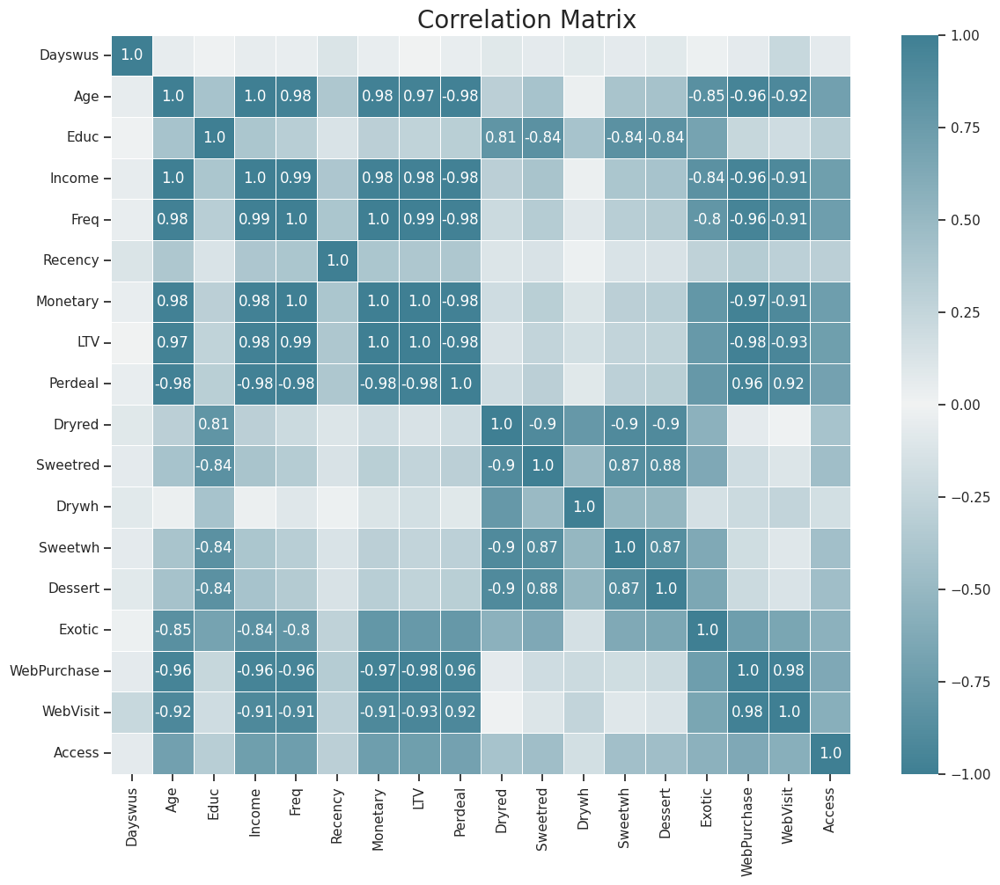

In [ ]:
  # Prepare figure
  fig = plt.figure(figsize=(15, 10))

  # Obtain correlation matrix. Round the values to 1 decimal cases. Use the DataFrame corr() and round() method.
  corr = np.round(df_mf_outlierm_incon.corr().corr(method="pearson"), decimals=2)

  # Build annotation matrix (values above |0.8| will appear annotated in the plot)
  mask_annot = np.absolute(corr.values) >= 0.8
  annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) # Try to understand what this np.where() does

  # Plot heatmap of the correlation matrix
  sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 220, as_cmap=True),
              fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

  # Layout
  fig.subplots_adjust(top=0.95)
  fig.suptitle("Correlation Matrix", fontsize=20)

  plt.show()

In [ ]:
# Calculate correlation matrix
corr_matrix = df_mf_outlierm_incon.corr()

# Create a mask for values above 0.7 and less than 1.0
mask = (corr_matrix.abs() >= 0.7) & (corr_matrix.abs() < 1.0)

# Iterate through the correlation matrix and print out pairs with correlations above 0.7
for i in range(len(corr_matrix.columns)):
    for j in range(i+1, len(corr_matrix.columns)):
        if mask.iloc[i, j]:
            print(f"Correlation between {corr_matrix.columns[i]} and {corr_matrix.columns[j]}: {corr_matrix.iloc[i, j]:.2f}")

Correlation between Age and Income: 0.93
Correlation between Age and Freq: 0.83
Correlation between Age and Monetary: 0.82
Correlation between Age and LTV: 0.78
Correlation between Age and Perdeal: -0.75
Correlation between Age and WebPurchase: -0.78
Correlation between Income and Freq: 0.87
Correlation between Income and Monetary: 0.85
Correlation between Income and LTV: 0.80
Correlation between Income and Perdeal: -0.78
Correlation between Income and WebPurchase: -0.73
Correlation between Freq and Monetary: 0.99
Correlation between Freq and LTV: 0.93
Correlation between Freq and Perdeal: -0.77
Correlation between Freq and WebPurchase: -0.74
Correlation between Monetary and LTV: 0.94
Correlation between Monetary and Perdeal: -0.74
Correlation between Monetary and WebPurchase: -0.73
Correlation between LTV and Perdeal: -0.74
Correlation between LTV and WebPurchase: -0.73
Correlation between WebPurchase and WebVisit: 0.88


In [ ]:
#Defining the variables for the problems
problem1 = ['Dayswus', 'Age', 'Educ', 'Income', 'Freq', 'Recency', 'Monetary', 'LTV', 'Perdeal', 'WebPurchase', 'WebVisit', 'Access']
problem2 = ['Dryred', 'Sweetred', 'Drywh', 'Sweetwh', 'Dessert', 'Exotic']

df_mf_outlierm_incon_p1 =df_mf_outlierm_incon[problem1]
df_mf_outlierm_incon_p2 =df_mf_outlierm_incon[problem2]

## Correlation - Problem 1

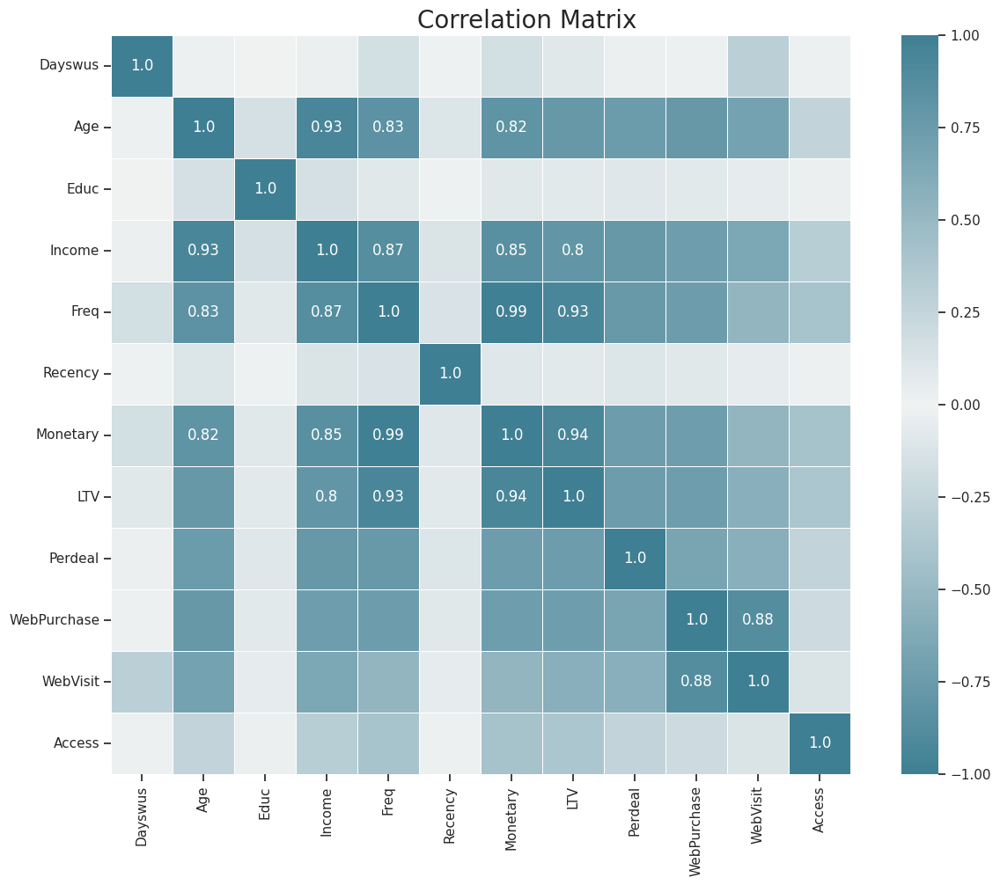

In [ ]:
  # Prepare figure
  fig = plt.figure(figsize=(15, 10))

  # Obtain correlation matrix. Round the values to 1 decimal cases. Use the DataFrame corr() and round() method.
  corr = np.round(df_mf_outlierm_incon[problem1].corr(method="pearson"), decimals=2)

  # Build annotation matrix (values above |0.8| will appear annotated in the plot)
  mask_annot = np.absolute(corr.values) >= 0.8
  annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) # Try to understand what this np.where() does

  # Plot heatmap of the correlation matrix
  sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 220, as_cmap=True),
              fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

  # Layout
  fig.subplots_adjust(top=0.95)
  fig.suptitle("Correlation Matrix", fontsize=20)

  plt.show()

## Correlation - Problem 2

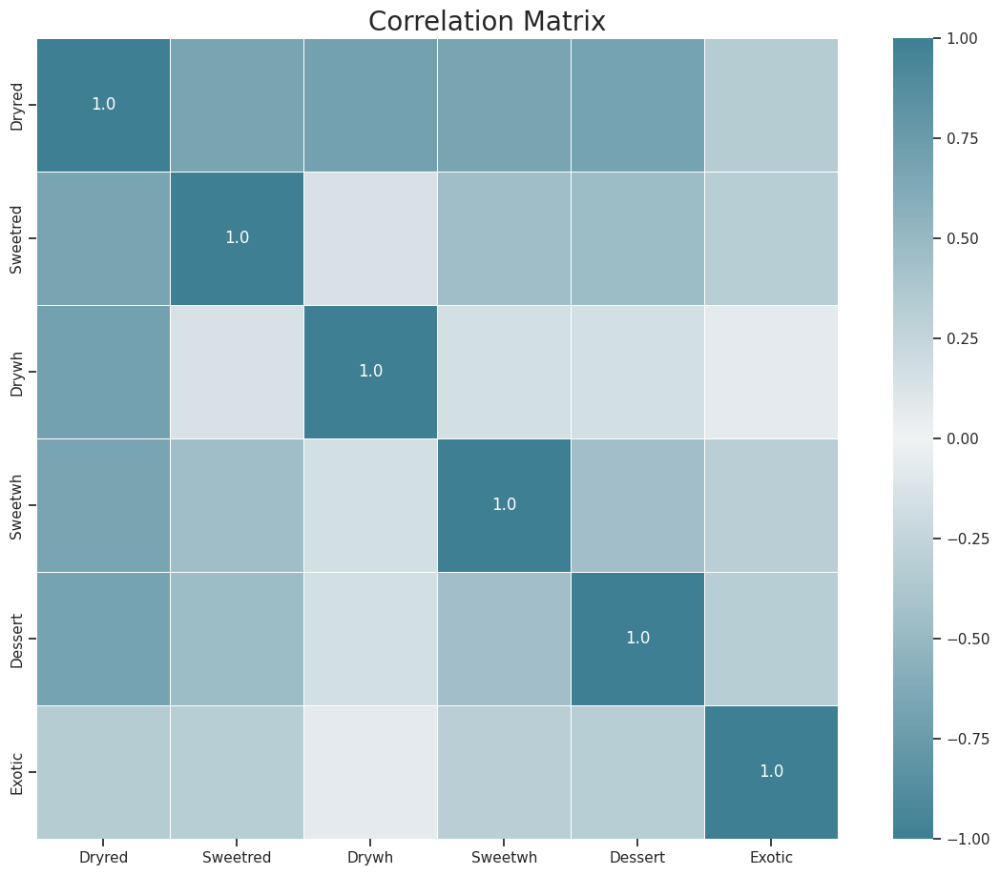

In [ ]:
  # Prepare figure
  fig = plt.figure(figsize=(15, 10))

  # Obtain correlation matrix. Round the values to 1 decimal cases. Use the DataFrame corr() and round() method.
  corr = np.round(df_mf_outlierm_incon[problem2].corr(method="pearson"), decimals=2)

  # Build annotation matrix (values above |0.8| will appear annotated in the plot)
  mask_annot = np.absolute(corr.values) >= 0.8
  annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) # Try to understand what this np.where() does

  # Plot heatmap of the correlation matrix
  sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 220, as_cmap=True),
              fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

  # Layout
  fig.subplots_adjust(top=0.95)
  fig.suptitle("Correlation Matrix", fontsize=20)

  plt.show()

## Correlated Features Removal

In [ ]:
df_mf_outlierm_incon.columns.to_list()

['Dayswus',
 'Age',
 'Educ',
 'Income',
 'Freq',
 'Recency',
 'Monetary',
 'LTV',
 'Perdeal',
 'Dryred',
 'Sweetred',
 'Drywh',
 'Sweetwh',
 'Dessert',
 'Exotic',
 'WebPurchase',
 'WebVisit',
 'Access']

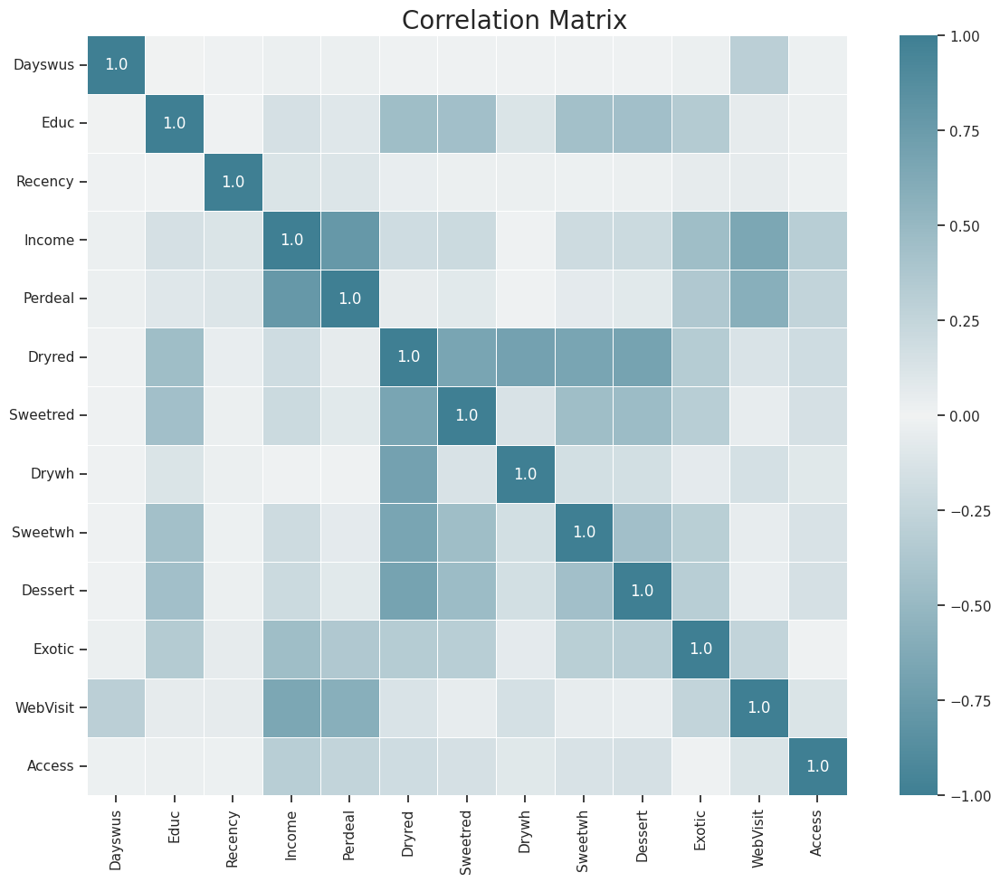

In [ ]:
  # Features to be removed - Age, Monetary, Freq, LTV, WebPurchase

corrclean = ['Dayswus', 'Educ', 'Recency', 'Income', 'Perdeal', 'Dryred', 'Sweetred', 'Drywh', 'Sweetwh', 'Dessert', 'Exotic', 'WebVisit', 'Access']
df_mf_outlierm_incon_corr = df_mf_outlierm_incon[corrclean]

  # Prepare figure
  fig = plt.figure(figsize=(15, 10))

  # Obtain correlation matrix. Round the values to 1 decimal cases. Use the DataFrame corr() and round() method.
  corr = np.round(df_mf_outlierm_incon_corr.corr(method="pearson"), decimals=2)

  # Build annotation matrix (values above |0.8| will appear annotated in the plot)
  mask_annot = np.absolute(corr.values) >= 0.8
  annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) # Try to understand what this np.where() does

  # Plot heatmap of the correlation matrix
  sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 220, as_cmap=True),
              fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

  # Layout
  fig.subplots_adjust(top=0.95)
  fig.suptitle("Correlation Matrix", fontsize=20)

  plt.show()

In [ ]:
# Metric removal from variable "metric_features"
metric_features.remove("Age")
metric_features.remove("Monetary")
metric_features.remove("Freq")
metric_features.remove("LTV")
metric_features.remove("WebPurchase")

# Data Preprocessing

## Feature Engineering

- *CUSTID* - customer ID number
- *DAYSWUS* - number of days as a customer
- *AGE* - customer's age
- *EDUCATION* - years of education
- *INCOME* - household income
- *KIDHOME* - 1=has child under 13 yo living at home
- *TEENHOME* - 1=has teen (13 to 19 yo) living at home
- *FREQ* - number of purchases in past 18 months
- *RECENCY* - number of days since last purchase
- *MONETARY* - total sales to this person in past 18 months
- *LTV* - customer lifetime value
- *PERDEAL* - % purchases bought on discount (units)
- *DRYRED* - % of wines that were dry red wines
- *SWEETRED* - % of wines that were sweet red wines
- *DRYWH* - % of wines that were dry white wines
- *SWEETWH* - % of wines that were sweet white wines
- *DESSERT* - % of wines that were dessert wines (port, sherry, etc.)
- *EXOTIC* - % of wines that were exotic wines
- *WEBPURCH* - % of purchases made on website/app
- *WEBVISIT* - average number of visits to website/app per month
- *ACCESS* - number of accessories bought in past 18 months

Guided by the explanations provided below for each point, we've chosen to create the following features:
- Perdeal_number: Freq*(Perdeal/100) - where the perdeal number is presented in % and we will normalize it to a specific number
- WebPurchase_value: Monetary*(WebPurchase/100) - where the WebPurchase value we will normalize it to a specific number
- WebPurchase_number: Freq*(WebPurchase/100) - where the WebPurchase number is presented in % and we will normalize it to a specific number
- All wine types to values (Dryred, Sweetred, Drywh, Sweetwh, Exotic): WhineType*Monetary - where the wine type value we will normalize it to a specific number

For the previous metrics, we believe that the only new feature that would be interesting to analyze would be the average sale value per each client purchase and the average price of each wine type per client.
- Avg Purchase Value per client: Monetary/Freq
- Avg Price Values for each wine type: (%Wine * Monetary Value)/Freq

## Data Normalization

### MinMax Scaler

In [ ]:
# Define the variable minmax_columns for the transformation
minmax_columns = df_mf_outlierm_incon_corr.columns.to_list()

In [ ]:
# Define the new dataframe variable for the minmax scaller and save the previous dataframe
df_mf_outlierm_incon_corr_minmax = df_mf_outlierm_incon_corr.copy()

In [ ]:
# Use MinMaxScaler to scale the dataframe defined
scaler = MinMaxScaler()
scaled_feat = scaler.fit_transform(df_mf_outlierm_incon_corr_minmax)
scaled_feat

array([[0.34142857, 0.5       , 0.44      , ..., 0.02083333, 0.33333333,
        0.33333333],
       [0.10428571, 1.        , 0.04      , ..., 0.02083333, 0.        ,
        0.        ],
       [0.04714286, 0.75      , 0.46      , ..., 0.65625   , 0.66666667,
        0.33333333],
       ...,
       [0.12428571, 0.375     , 0.5       , ..., 0.01041667, 0.44444444,
        0.66666667],
       [0.05142857, 0.875     , 0.65333333, ..., 0.04166667, 0.22222222,
        0.        ],
       [0.06857143, 0.25      , 0.02666667, ..., 0.08333333, 0.33333333,
        0.        ]])

In [ ]:
# Transformation into a dataframe
df_mf_outlierm_incon_corr_minmax = pd.DataFrame(scaled_feat, index=df_mf_outlierm_incon_corr.index, columns=minmax_columns)
df_mf_outlierm_incon_corr_minmax

,Dayswus,Educ,Recency,Income,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebVisit,Access
Custid,,,,,,,,,,,,,
1001,0.341429,0.500,0.440000,0.622693,0.030928,0.367347,0.125,0.671875,0.285714,0.085714,0.020833,0.333333,0.333333
1002,0.104286,1.000,0.040000,0.794134,0.010309,0.551020,0.025,0.578125,0.114286,0.057143,0.020833,0.000000,0.000000
1003,0.047143,0.750,0.460000,0.141401,0.680412,0.316327,0.475,0.359375,0.028571,0.685714,0.656250,0.666667,0.333333
1004,0.490000,0.875,0.066667,0.644192,0.123711,0.602041,0.250,0.281250,0.171429,0.142857,0.156250,0.444444,0.000000
1005,0.731429,0.750,0.173333,0.630941,0.051546,0.591837,0.125,0.421875,0.114286,0.114286,0.197917,0.555556,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10995,0.678571,0.375,0.040000,0.370932,0.680412,0.530612,0.150,0.421875,0.200000,0.171429,0.093750,0.777778,0.000000
10996,0.595714,0.625,0.480000,0.341417,0.072165,0.408163,0.275,0.546875,0.028571,0.314286,0.437500,0.555556,0.000000
10997,0.124286,0.375,0.500000,0.893872,0.030928,0.612245,0.050,0.375000,0.142857,0.171429,0.010417,0.444444,0.666667


### Standard Scaling

In [ ]:
# Standard scaller columns defined as per the followed variable
standard_columns = df_mf_outlierm_incon_corr.columns.to_list()

In [ ]:
df_mf_outlierm_incon_corr_standard = df_mf_outlierm_incon_corr.copy()

In [ ]:
sscaler = StandardScaler()
sscaled_feat = sscaler.fit_transform(df_mf_outlierm_incon_corr_standard)

In [ ]:
df_mf_outlierm_incon_corr_standard = sscaled_feat

In [ ]:
df_mf_outlierm_incon_corr_standard = pd.DataFrame(sscaled_feat, index=df_mf_outlierm_incon_corr.index, columns=standard_columns)
df_mf_outlierm_incon_corr_standard

,Dayswus,Educ,Recency,Income,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebVisit,Access
Custid,,,,,,,,,,,,,
1001,-0.536734,-0.446106,0.342633,0.753299,-1.050415,-0.641071,-0.239147,1.231811,0.500328,-0.509803,-0.846578,-0.523575,1.418907
1002,-1.358353,1.744023,-1.391997,1.577903,-1.122422,0.149024,-0.789587,0.751025,-0.368871,-0.657182,-0.846578,-1.818202,-0.457134
1003,-1.556334,0.648959,0.429364,-1.561642,1.217803,-0.860542,1.687394,-0.370810,-0.803471,2.585170,2.871214,0.771053,1.418907
1004,-0.021984,1.196491,-1.276355,0.856704,-0.726384,0.368495,0.448904,-0.771465,-0.079138,-0.215043,-0.054262,-0.092032,-0.457134
1005,0.814484,0.648959,-0.813787,0.792970,-0.978408,0.324601,-0.239147,-0.050286,-0.368871,-0.362423,0.189528,0.339511,-0.457134
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10995,0.631352,-0.993638,-1.391997,-0.457635,1.217803,0.061236,-0.101537,-0.050286,0.065728,-0.067664,-0.419946,1.202596,-0.457134
10996,0.344280,0.101426,0.516095,-0.599598,-0.906401,-0.465494,0.586514,0.590763,-0.803471,0.669235,1.591318,0.339511,-0.457134
10997,-1.289060,-0.993638,0.602827,2.057627,-1.050415,0.412390,-0.651977,-0.290679,-0.224005,-0.067664,-0.907526,-0.092032,3.294949


# PCA ANALYSIS

In [ ]:
# PCA initial dataframe defined as the copy of the final previous from minmax
df_mf_outlierm_incon_corr_minmax_pca = df_mf_outlierm_incon_corr_minmax.copy()

In [ ]:
pca = PCA()
pca_feat = pca.fit_transform(df_mf_outlierm_incon_corr_minmax_pca)
pca_feat

array([[-2.66266052e-01, -3.65725738e-01,  1.60168647e-02, ...,
        -1.06265058e-01,  6.04102923e-02, -7.38935594e-03],
       [-7.45231064e-01, -2.71926988e-01,  2.87728318e-01, ...,
         7.51454647e-02, -7.39603509e-02,  1.39448843e-04],
       [ 5.91351325e-01, -5.75361350e-02,  5.18154176e-01, ...,
         3.80856509e-02, -4.38714101e-02,  7.54989346e-05],
       ...,
       [-5.07105947e-01, -2.17293340e-01,  1.92564143e-01, ...,
        -2.50895411e-01, -1.36522934e-01, -7.36191916e-03],
       [-3.99495663e-01, -3.42929856e-01,  3.54560087e-01, ...,
         2.09561682e-02, -9.32341916e-02, -4.85191784e-05],
       [-2.90295339e-01, -4.49484874e-01,  2.24062571e-01, ...,
        -4.01440104e-02, -1.47335603e-01,  9.17951640e-05]])

In [ ]:
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,0.173123,0.000000,0.269448,0.269448
2,0.139864,-0.033259,0.217684,0.487133
3,0.084781,-0.055083,0.131953,0.619085
4,0.052509,-0.032271,0.081726,0.700811
5,0.046364,-0.006145,0.072161,0.772972
6,0.031850,-0.014514,0.049571,0.822543
7,0.025524,-0.006326,0.039726,0.862269
8,0.023599,-0.001925,0.036730,0.898999
9,0.021331,-0.002268,0.033200,0.932199
10,0.018429,-0.002903,0.028683,0.960882


In [ ]:
def plot_scree_variance(pca):
    # figure and axes
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

    # draw plots
    ax1.plot(pca.explained_variance_, marker=".", markersize=12)
    ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
    ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

    # customizations
    ax2.legend()
    ax1.set_title("Scree Plot", fontsize=14)
    ax2.set_title("Variance Explained", fontsize=14)
    ax1.set_ylabel("Eigenvalue")
    ax2.set_ylabel("Proportion")
    ax1.set_xlabel("Components")
    ax2.set_xlabel("Components")
    ax1.set_xticks(range(0, pca.n_components_, 2))
    ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
    ax2.set_xticks(range(0, pca.n_components_, 2))
    ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

    plt.show()

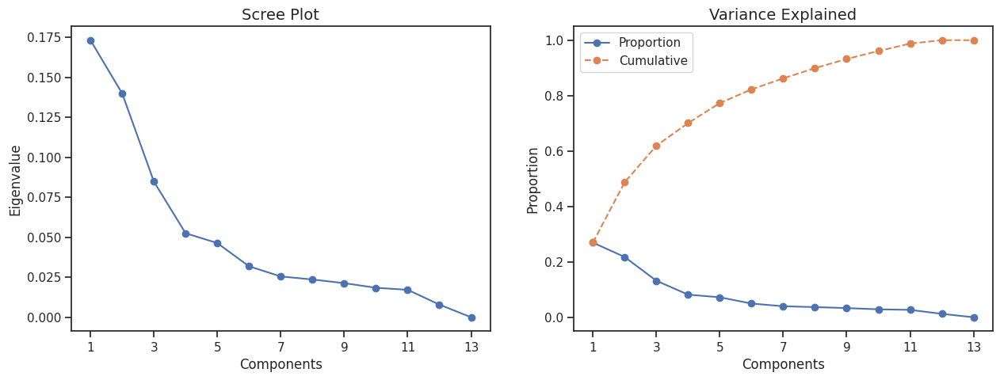

In [ ]:
plot_scree_variance(pca)

In [ ]:
#Define 4 components in PCA
pca = PCA(n_components=4)
pca_feat = pca.fit_transform(df_mf_outlierm_incon_corr_minmax_pca)
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_df = pd.DataFrame(pca_feat, index=df_mf_outlierm_incon_corr_minmax.index, columns=pca_feat_names)  # remember index=df_pca.index
pca_df

,PC0,PC1,PC2,PC3
Custid,,,,
1001,-0.266266,-0.365726,0.016017,0.119052
1002,-0.745231,-0.271927,0.287728,-0.176969
1003,0.591351,-0.057536,0.518154,-0.007183
1004,-0.316373,0.026406,-0.064711,-0.254558
1005,-0.258023,0.086227,-0.314075,-0.128732
...,...,...,...,...
10995,0.372928,0.256911,-0.136045,-0.357775
10996,0.101641,-0.109084,-0.147615,0.134550
10997,-0.507106,-0.217293,0.192564,0.059119


In [ ]:
 df_mf_outlierm_incon_corr_minmax_pca = pd.concat([df_mf_outlierm_incon_corr_minmax_pca, pca_df], axis=1)
df_mf_outlierm_incon_corr_minmax_pca.head()

,Dayswus,Educ,Recency,Income,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebVisit,Access,PC0,PC1,PC2,PC3
Custid,,,,,,,,,,,,,,,,,
1001,0.341429,0.500,0.440000,0.622693,0.030928,0.367347,0.125,0.671875,0.285714,0.085714,0.020833,0.333333,0.333333,-0.266266,-0.365726,0.016017,0.119052
1002,0.104286,1.000,0.040000,0.794134,0.010309,0.551020,0.025,0.578125,0.114286,0.057143,0.020833,0.000000,0.000000,-0.745231,-0.271927,0.287728,-0.176969
1003,0.047143,0.750,0.460000,0.141401,0.680412,0.316327,0.475,0.359375,0.028571,0.685714,0.656250,0.666667,0.333333,0.591351,-0.057536,0.518154,-0.007183
1004,0.490000,0.875,0.066667,0.644192,0.123711,0.602041,0.250,0.281250,0.171429,0.142857,0.156250,0.444444,0.000000,-0.316373,0.026406,-0.064711,-0.254558
1005,0.731429,0.750,0.173333,0.630941,0.051546,0.591837,0.125,0.421875,0.114286,0.114286,0.197917,0.555556,0.000000,-0.258023,0.086227,-0.314075,-0.128732


In [ ]:
def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_mf_outlierm_incon_corr_minmax_pca.corr().loc[df_mf_outlierm_incon_corr_minmax_pca.columns]
loadings.style.applymap(_color_red_or_green)

,Dayswus,Educ,Recency,Income,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebVisit,Access,PC0,PC1,PC2,PC3
Dayswus,1.000000,0.000232,-0.014728,-0.029472,0.025167,0.013413,-0.006065,-0.009995,-0.007043,-0.012723,0.025839,0.298877,-0.022305,0.156045,0.267253,-0.936151,0.077737
Educ,0.000232,1.000000,-0.011844,0.151491,-0.096460,0.464392,-0.437179,-0.117649,-0.433282,-0.435704,-0.342949,-0.062021,0.026964,-0.479034,0.459776,0.090991,0.173983
Recency,-0.014728,-0.011844,1.000000,-0.117863,0.111929,-0.042894,0.031401,0.028435,0.024283,0.032922,0.060077,0.061619,-0.024984,0.150908,0.041519,0.118027,0.947019
Income,-0.029472,0.151491,-0.117863,1.000000,-0.784125,0.190507,-0.205826,-0.005591,-0.198607,-0.206757,-0.464858,-0.649661,0.324783,-0.828256,-0.333170,-0.207894,0.027835
Perdeal,0.025167,-0.096460,0.111929,-0.784125,1.000000,-0.064360,0.076335,-0.006901,0.066634,0.079190,0.360682,0.579439,-0.255644,0.760349,0.453046,0.273583,-0.014252
Dryred,0.013413,0.464392,-0.042894,0.190507,-0.064360,1.000000,-0.674178,-0.696153,-0.671834,-0.675058,-0.327491,0.130374,0.187030,-0.554943,0.769273,0.109117,-0.073277
Sweetred,-0.006065,-0.437179,0.031401,-0.205826,0.076335,-0.674178,1.000000,0.144674,0.456844,0.465133,0.317109,-0.053667,-0.151733,0.475274,-0.544100,-0.071786,-0.041960
Drywh,-0.009995,-0.117649,0.028435,-0.005591,-0.006901,-0.696153,0.144674,1.000000,0.168408,0.174792,0.067604,-0.155931,-0.092926,0.209475,-0.478600,-0.077226,0.205955
Sweetwh,-0.007043,-0.433282,0.024283,-0.198607,0.066634,-0.671834,0.456844,0.168408,1.000000,0.443324,0.308805,-0.052477,-0.144566,0.475513,-0.560604,-0.079594,-0.049280
Dessert,-0.012723,-0.435704,0.032922,-0.206757,0.079190,-0.675058,0.465133,0.174792,0.443324,1.000000,0.322009,-0.040951,-0.148345,0.487236,-0.553209,-0.067471,-0.038006


# Reevaluation on Data Exploration

In [ ]:
df_mf_outlierm_incon_corr_minmax_pca.describe()

,Dayswus,Educ,Recency,Income,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebVisit,Access,PC0,PC1,PC2,PC3
count,9636.000000,9636.000000,9636.000000,9636.000000,9636.000000,9636.000000,9636.000000,9636.000000,9636.000000,9636.000000,9636.000000,9636.000000,9636.000000,9.636000e+03,9.636000e+03,9.636000e+03,9.636000e+03
mean,0.496345,0.601845,0.360990,0.466077,0.331705,0.516377,0.168446,0.431680,0.187037,0.184546,0.165524,0.468140,0.081223,5.594897e-17,-2.027805e-17,-1.290421e-17,1.124510e-17
std,0.288643,0.228309,0.230609,0.207918,0.286356,0.232482,0.181682,0.195003,0.197236,0.193873,0.170921,0.257488,0.177688,4.160804e-01,3.739838e-01,2.911711e-01,2.291492e-01
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.004586e+00,-1.062698e+00,-6.545922e-01,-5.284649e-01
25%,0.247143,0.375000,0.173333,0.300254,0.061856,0.336735,0.050000,0.281250,0.028571,0.057143,0.041667,0.222222,0.000000,-3.167338e-01,-2.829107e-01,-2.375949e-01,-1.778049e-01
50%,0.490000,0.625000,0.346667,0.467583,0.257732,0.520408,0.100000,0.421875,0.114286,0.114286,0.104167,0.555556,0.000000,-6.615213e-02,1.038720e-02,6.519622e-03,-1.055467e-02
75%,0.745714,0.750000,0.520000,0.632932,0.567010,0.704082,0.225000,0.562500,0.257143,0.257143,0.229167,0.666667,0.000000,2.781743e-01,2.952615e-01,2.356447e-01,1.562999e-01
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.356407e+00,1.091387e+00,7.356165e-01,7.440315e-01


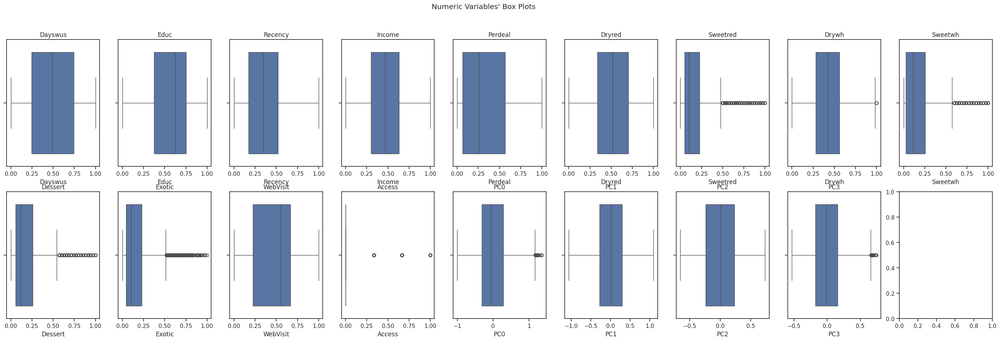

In [ ]:
plot_multiple_boxplots(df_mf_outlierm_incon_corr_minmax_pca, df_mf_outlierm_incon_corr_minmax_pca.columns)

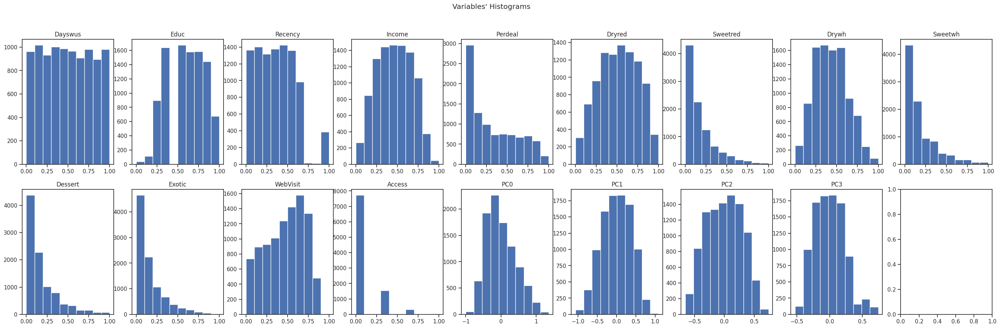

In [ ]:
plot_multiple_histograms(df_mf_outlierm_incon_corr_minmax_pca, df_mf_outlierm_incon_corr_minmax_pca.columns)

# Customizing the Different Datasets (Problem 1 & 2)

In [ ]:
df_mf_outlierm_incon_corr_minmax_pca.columns

Index(['Dayswus', 'Educ', 'Recency', 'Income', 'Perdeal', 'Dryred', 'Sweetred',
       'Drywh', 'Sweetwh', 'Dessert', 'Exotic', 'WebVisit', 'Access', 'PC0',
       'PC1', 'PC2', 'PC3'],
      dtype='object')

In [ ]:
print(problem1)
print(problem2)
pca_cols = df_mf_outlierm_incon_corr_minmax_pca.columns[df_mf_outlierm_incon_corr_minmax_pca.columns.str.startswith('PC')].to_list()
print(pca_cols)

['Dayswus', 'Age', 'Educ', 'Income', 'Freq', 'Recency', 'Monetary', 'LTV', 'Perdeal', 'WebPurchase', 'WebVisit', 'Access']
['Dryred', 'Sweetred', 'Drywh', 'Sweetwh', 'Dessert', 'Exotic']
['PC0', 'PC1', 'PC2', 'PC3']


In [ ]:
## Features to be removed from the variables problem 1 - Age, Income, Freq, LTV, WebPurchase

problem1.remove("Age")
problem1.remove("Monetary")
problem1.remove("Freq")
problem1.remove("LTV")
problem1.remove("WebPurchase")

In [ ]:
print(problem1)
print(problem2)

['Dayswus', 'Educ', 'Income', 'Recency', 'Perdeal', 'WebVisit', 'Access']
['Dryred', 'Sweetred', 'Drywh', 'Sweetwh', 'Dessert', 'Exotic']


In [ ]:
# Definition of both inital dataframes for problems 1 and 2, already containing all the transformations needed
df_mf_outlierm_incon_corr_minmax_p1 = df_mf_outlierm_incon_corr_minmax_pca[problem1]
df_mf_outlierm_incon_corr_minmax_p2 = df_mf_outlierm_incon_corr_minmax_pca[problem2]

print(df_mf_outlierm_incon_corr_minmax_p1)
print(df_mf_outlierm_incon_corr_minmax_p2)

         Dayswus   Educ    Income   Recency   Perdeal  WebVisit    Access
Custid                                                                   
1001    0.341429  0.500  0.622693  0.440000  0.030928  0.333333  0.333333
1002    0.104286  1.000  0.794134  0.040000  0.010309  0.000000  0.000000
1003    0.047143  0.750  0.141401  0.460000  0.680412  0.666667  0.333333
1004    0.490000  0.875  0.644192  0.066667  0.123711  0.444444  0.000000
1005    0.731429  0.750  0.630941  0.173333  0.051546  0.555556  0.000000
...          ...    ...       ...       ...       ...       ...       ...
10995   0.678571  0.375  0.370932  0.040000  0.680412  0.777778  0.000000
10996   0.595714  0.625  0.341417  0.480000  0.072165  0.555556  0.000000
10997   0.124286  0.375  0.893872  0.500000  0.030928  0.444444  0.666667
10998   0.051429  0.875  0.690881  0.653333  0.020619  0.222222  0.000000
10999   0.068571  0.250  0.778679  0.026667  0.041237  0.333333  0.000000

[9636 rows x 7 columns]
          Dry

#### Remove Noise With DBSCAN

In [ ]:
def split_noise_rows(df, feats, dbs_model):
  ## Splits the dataframe into noise and non-noise
  dbscan_labels = dbs_model.fit_predict(df[feats])

  df_concat = pd.concat([df,
                            pd.Series(dbscan_labels,
                                      name='dbscan_labels',
                                      index=df.index)], axis=1)

  df_noise = df_concat[df_concat['dbscan_labels']==-1].copy()
  df_nonoise = df_concat[df_concat['dbscan_labels']==0].copy()


  return df_noise, df_nonoise, df_concat

In [ ]:
## Refer to previous notebook for how to tune DBSCAN
## Based on the hyperparameters we found

dbscan = DBSCAN(eps=1.9, min_samples=20, n_jobs=4)

df_noise, df_nonoise, df_combined_noise = split_noise_rows(df, metric_features, dbscan)

In [ ]:
## Rename df_nonoise dataframe to df for simplicity
## Remember the df_combined_noise dataframe has both noise and non noise rows

print(df_combined_noise.shape)
print(df_nonoise.shape)
print(df_noise.shape)

df = df_nonoise.copy()

(10000, 21)
(0, 21)
(10000, 21)


# Clustering

# Clustering Solutions

# Problem 1 - Value Segmentation

In [ ]:
def cluster_profiles(df,
                     label_columns,
                     figsize,
                     compar_titles=None,
                     colors='Set1'):
    """
    Pass df with labels columns of one or multiple clustering labels.
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)

    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2,
                             figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):

        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)

        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]

        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label,
                                         color=sns.color_palette(palette=colors), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1],
                    palette=sns.color_palette(palette=colors))

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy')
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[0].legend(loc='center left', bbox_to_anchor=(1, 0.5))
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)

    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()

#### R2 Plot for decision of Cluster Solution

In [ ]:
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

def r2(df, labels):
    sst = get_ss(df)
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst

def get_r2_scores(df, clusterer, min_k=2, max_k=10):
    """
    Loop over different values of k. To be used with sklearn clusterers.
    """
    r2_clust = {}
    for n in range(min_k, max_k):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2(df, labels)
    return r2_clust

In [ ]:
# Set up the clusterers
kmeans = KMeans(
    init='k-means++',
    n_init=20,
    random_state=42
)

hierarchical = AgglomerativeClustering(
    affinity='euclidean'
)

In [ ]:
# Obtaining the R² scores for each cluster solution on demographic variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_mf_outlierm_incon_corr_minmax_p1, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df_mf_outlierm_incon_corr_minmax_p1, hierarchical.set_params(linkage=linkage)
    )

pd.DataFrame(r2_scores)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be

,kmeans,complete,average,single,ward
2,0.280177,0.190951,0.041773,0.000227,0.242138
3,0.374613,0.279737,0.264999,0.000815,0.320917
4,0.443906,0.348375,0.304123,0.001172,0.377773
5,0.480792,0.390564,0.311226,0.001423,0.426020
6,0.514917,0.414849,0.311398,0.001443,0.462314
7,0.545052,0.441697,0.312273,0.001628,0.497932
8,0.568192,0.452639,0.398645,0.002313,0.519678
9,0.587149,0.499229,0.441070,0.002650,0.534798


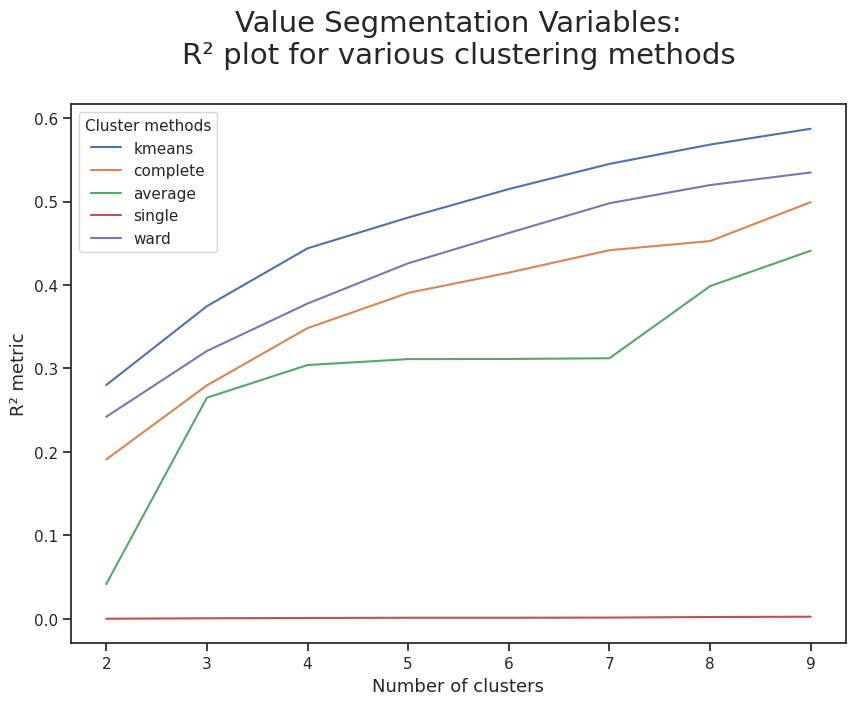

In [ ]:
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Value Segmentation Variables:\nR² plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R² metric", fontsize=13)
plt.show()

#### K-Means


In [ ]:
df_mf_outlierm_incon_corr_minmax_p1_km = df_mf_outlierm_incon_corr_minmax_p1.copy()
df_mf_outlierm_incon_corr_minmax_p1_km.head()

,Dayswus,Educ,Income,Recency,Perdeal,WebVisit,Access
Custid,,,,,,,
1001,0.341429,0.500,0.622693,0.440000,0.030928,0.333333,0.333333
1002,0.104286,1.000,0.794134,0.040000,0.010309,0.000000,0.000000
1003,0.047143,0.750,0.141401,0.460000,0.680412,0.666667,0.333333
1004,0.490000,0.875,0.644192,0.066667,0.123711,0.444444,0.000000
1005,0.731429,0.750,0.630941,0.173333,0.051546,0.555556,0.000000


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

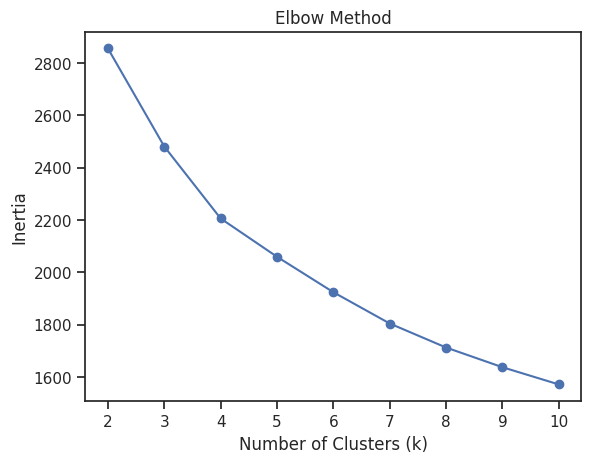

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

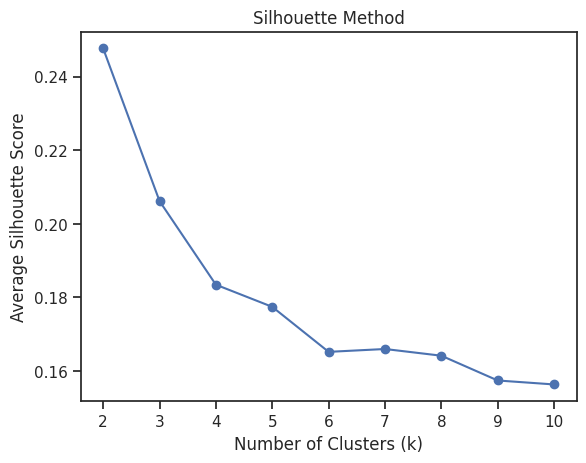

In [ ]:
# Elbow Method
inertia_values = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df_mf_outlierm_incon_corr_minmax_p1_km)
    inertia_values.append(kmeans.inertia_)

# Plot the Elbow curve
plt.plot(range(2, 11), inertia_values, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.show()

# Silhouette Method
silhouette_scores = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(df_mf_outlierm_incon_corr_minmax_p1_km)
    silhouette_avg = silhouette_score(df_mf_outlierm_incon_corr_minmax_p1_km, labels)
    silhouette_scores.append(silhouette_avg)

# Plot the Silhouette curve
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title('Silhouette Method')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Average Silhouette Score')
plt.show()


In [ ]:
# Set up the clusterers
kmeans_p1 = KMeans(n_clusters=4,
    init='k-means++',
    n_init=20,
    random_state=42
)

In [ ]:
problem1_cluster = kmeans_p1.fit_predict(df_mf_outlierm_incon_corr_minmax_p1_km)

df_mf_outlierm_incon_corr_minmax_p1_km['Problem1_cluster'] = problem1_cluster
df_mf_outlierm_incon_corr_minmax_p1_km.head(3)


,Dayswus,Educ,Income,Recency,Perdeal,WebVisit,Access,Problem1_cluster
Custid,,,,,,,,
1001,0.341429,0.50,0.622693,0.44,0.030928,0.333333,0.333333,1
1002,0.104286,1.00,0.794134,0.04,0.010309,0.000000,0.000000,1
1003,0.047143,0.75,0.141401,0.46,0.680412,0.666667,0.333333,2


In [ ]:
kmeans_p1.predict(df_mf_outlierm_incon_corr_minmax_p1_km)

array([1, 1, 3, ..., 1, 1, 1], dtype=int32)

In [ ]:
pd.DataFrame(kmeans_p1.transform(df_mf_outlierm_incon_corr_minmax_p1_km))

,0,1,2,3
0,2.207237,0.306496,1.226756,1.127654
1,2.423309,0.576835,1.463748,1.378992
2,1.277519,1.409500,2.054500,1.054086
3,0.849563,2.066139,3.090795,1.098170
4,0.748773,2.099364,3.107406,1.033430
...,...,...,...,...
9631,3.028801,1.459041,0.661278,2.148645
9632,0.607691,2.093399,3.057854,1.062540
9633,2.373247,0.716358,1.437714,1.380007
9634,2.329397,0.490007,1.306555,1.315706


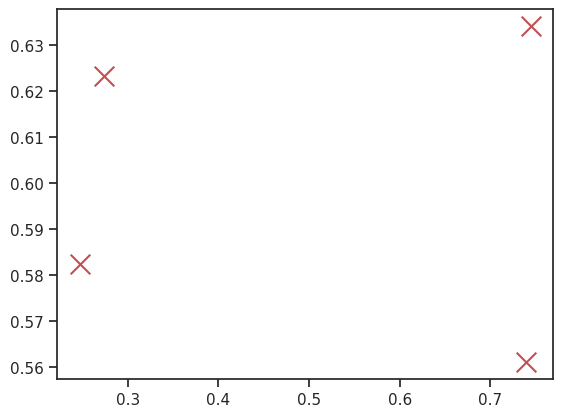

[[7.39138520e-01 5.61177553e-01 2.74245282e-01 3.82799755e-01
  6.23346200e-01 7.15475825e-01 3.61852193e-02 3.00000000e+00]
 [2.73950121e-01 6.23340708e-01 6.60790940e-01 3.32767498e-01
  7.59137769e-02 1.87047466e-01 1.38911236e-01 1.00000000e+00]
 [2.47200423e-01 5.82391036e-01 3.14911182e-01 4.03793860e-01
  5.40274858e-01 5.50758406e-01 3.91995614e-02 3.57491814e-14]
 [7.44364892e-01 6.34188286e-01 5.84245642e-01 3.29012055e-01
  1.33052098e-01 4.52480783e-01 1.03511530e-01 2.00000000e+00]]


In [ ]:
centroids = kmeans_p1.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1], c='r', marker='x', s=200)

plt.show()
print(centroids)

In [ ]:
print(centroids[:,1])

[0.56117755 0.62334071 0.58239104 0.63418829]


#### Hierarchical Clustering

In [ ]:
df_mf_outlierm_incon_corr_minmax_p1_hc = df_mf_outlierm_incon_corr_minmax_p1.copy()
df_mf_outlierm_incon_corr_minmax_p1_hc.head()

In [ ]:
# Performing HC
hclust = AgglomerativeClustering(linkage='ward', affinity='euclidean', n_clusters=3)
hc_labels = hclust.fit_predict(df_mf_outlierm_incon_corr_minmax_p1_hc)
hc_labels

In [ ]:
df_mf_outlierm_incon_corr_minmax_p1_hc['hc_labels'] = hc_labels
df_mf_outlierm_incon_corr_minmax_p1_hc
df_mf_outlierm_incon_corr_minmax_p1_hc.groupby('hc_labels').mean()

In [ ]:
# setting distance_threshold=0 and n_clusters=None ensures we compute the full tree

linkage = 'ward'
distance = 'euclidean'

hclust = AgglomerativeClustering(linkage=linkage,
                                 affinity=distance,
                                 distance_threshold=0,
                                 n_clusters=None)

hclust.fit_predict(df_mf_outlierm_incon_corr_minmax_p1_hc)

In [ ]:
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count



## Create linkage matrix

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)


# Plot the corresponding dendrogram

sns.set()
fig = plt.figure(figsize=(11,5))


# The Dendrogram parameters need to be tuned
y_threshold = 17


# "dendrogram" function will plot our dendrogram
dendrogram(linkage_matrix,
           truncate_mode='level',
           p=5,
           color_threshold=y_threshold,
           above_threshold_color='k')


plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

#### RFM Clustering

In [ ]:
df_mf_outlierm_incon_rfm = df_mf_outlierm_incon[['Recency', 'Freq', 'Monetary']]
df_mf_outlierm_incon_rfm

In [ ]:
# Assign RFM scores
quantiles = df_mf_outlierm_incon_rfm.quantile(q=[0.25,0.5,0.75])
quantiles = quantiles.to_dict()

def RScore(x,p,d):
    if x <= d[p][0.25]:
        return 4
    elif x <= d[p][0.50]:
        return 3
    elif x <= d[p][0.75]:
        return 2
    else:
        return 1

def FMScore(x,p,d):
    if x <= d[p][0.25]:
        return 1
    elif x <= d[p][0.50]:
        return 2
    elif x <= d[p][0.75]:
        return 3
    else:
        return 4

In [ ]:
df_mf_outlierm_incon_rfm['R'] = df_mf_outlierm_incon_rfm['Recency'].apply(RScore, args=('Recency',quantiles,))
df_mf_outlierm_incon_rfm['F'] = df_mf_outlierm_incon_rfm['Freq'].apply(FMScore, args=('Freq',quantiles,))
df_mf_outlierm_incon_rfm['M'] = df_mf_outlierm_incon_rfm['Monetary'].apply(FMScore, args=('Monetary',quantiles,))
df_mf_outlierm_incon_rfm['RFM_Score'] = df_mf_outlierm_incon_rfm[['R','F','M']].sum(axis=1)

In [ ]:
# Analyze the results
df_mf_outlierm_incon_rfm

In [ ]:
df_mf_outlierm_incon_rfm['combined'] = df_mf_outlierm_incon_rfm['R'].astype(str).str.zfill(1) + df_mf_outlierm_incon_rfm['F'].astype(str).str.zfill(1) + df_mf_outlierm_incon_rfm['M'].astype(str).str.zfill(1)

In [ ]:
df_mf_outlierm_incon_rfm

In [ ]:
sns.countplot(x=df_mf_outlierm_incon_rfm['RFM_Score'])

In [ ]:
df_mf_outlierm_incon_corr_minmax

In [ ]:
df_mf_outlierm_incon_corr_minmax_rfm = pd.concat([df_mf_outlierm_incon_corr_minmax, df_mf_outlierm_incon_rfm['combined']], axis=1)
df_mf_outlierm_incon_corr_minmax_rfm_combined444 = df_mf_outlierm_incon_corr_minmax_rfm[df_mf_outlierm_incon_corr_minmax_rfm['combined']=='444']

In [ ]:
sns.set()

cluster_profiles(
    df=df_mf_outlierm_incon_corr_minmax_rfm_combined444,
    label_columns=['combined'],
    figsize=(28, 5),
    compar_titles=["Value Segmentation clustering - RFM"],
    colors='Set2'
)

#### DBSCAN

In [ ]:
df_mf_outlierm_incon_corr_minmax_p1_db = df_mf_outlierm_incon_corr_minmax_p1.copy()
df_mf_outlierm_incon_corr_minmax_p1_db.head()

In [ ]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_mf_outlierm_incon_corr_minmax_p1_db)

# Range of values for 'eps' and 'min_samples'
eps_values = np.logspace(-2, 1, 20)
min_samples_values = range(5, 20)

# Calculate silhouette scores for each combination
silhouette_scores = np.zeros((len(min_samples_values), len(eps_values)))

for i, min_samples in enumerate(min_samples_values):
    for j, eps in enumerate(eps_values):
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(scaled_data)

        # Skip calculations if only one label is assigned
        if len(set(labels)) > 1:
            silhouette_scores[i, j] = silhouette_score(scaled_data, labels)

# Plot the results
plt.figure(figsize=(10, 6))
for i, min_samples in enumerate(min_samples_values):
    plt.plot(eps_values, silhouette_scores[i], label=f'min_samples = {min_samples}')

plt.xlabel('Epsilon (eps)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for DBSCAN Parameter Tuning')
plt.xscale('log')
plt.legend()
plt.show()

In [ ]:
# Perform DBSCAN clustering
dbscan = DBSCAN(eps=0.35, min_samples=5, n_jobs=4)
dbscan_labels = dbscan.fit_predict(df_mf_outlierm_incon_corr_minmax_p1_db)

print("Number of estimated clusters  :", len(set(dbscan_labels)))
print("Counter of cluster labels     :", Counter(dbscan_labels))

# Check if there are non-noise points
non_noise_points = len(df_mf_outlierm_incon_corr_minmax_p1_db[dbscan_labels != -1])

if non_noise_points > 0:
    percentage_noise = round(100 * Counter(dbscan_labels)[-1] / df_mf_outlierm_incon_corr_minmax_p1_db.shape[0], 2)
    print("Percentage of noise rows      :", percentage_noise)
else:
    print("No non-noise points in the data.")

In [ ]:
dbscan_labels

# Problem 2 - Wine Segmentation

#### R2 Plot for decision of Cluster Solution

In [ ]:
# Set up the clusterers
kmeans = KMeans(
    init='k-means++',
    n_init=20,
    random_state=42
)

hierarchical = AgglomerativeClustering(
    affinity='euclidean'
)

In [ ]:
# Obtaining the R² scores for each cluster solution on demographic variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_mf_outlierm_incon_corr_minmax_p2, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df_mf_outlierm_incon_corr_minmax_p2, hierarchical.set_params(linkage=linkage)
    )

pd.DataFrame(r2_scores)

In [ ]:
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Value Segmentation Variables:\nR² plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R² metric", fontsize=13)
plt.show()

#### K-Means

In [ ]:
df_mf_outlierm_incon_corr_minmax_p2_km = df_mf_outlierm_incon_corr_minmax_p2.copy()
df_mf_outlierm_incon_corr_minmax_p2_km.head()

In [ ]:
# Elbow Method
inertia_values = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df_mf_outlierm_incon_corr_minmax_p2_km)
    inertia_values.append(kmeans.inertia_)

# Plot the Elbow curve
plt.plot(range(2, 11), inertia_values, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.show()

# Silhouette Method
silhouette_scores = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(df_mf_outlierm_incon_corr_minmax_p2_km)
    silhouette_avg = silhouette_score(df_mf_outlierm_incon_corr_minmax_p2_km, labels)
    silhouette_scores.append(silhouette_avg)

# Plot the Silhouette curve
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title('Silhouette Method')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Average Silhouette Score')
plt.show()

In [ ]:
# Set up the clusterers
kmeans_p2 = KMeans(n_clusters=3,
    init='k-means++',
    n_init=20,
    random_state=42
)

In [ ]:
# the fit method
problem2_cluster = kmeans_p2.fit_predict(df_mf_outlierm_incon_corr_minmax_p2_km)

df_mf_outlierm_incon_corr_minmax_p2_km['Problem2_cluster'] = problem2_cluster
df_mf_outlierm_incon_corr_minmax_p2_km.head(3)

In [ ]:
pd.DataFrame(kmeans_p2.transform(df_mf_outlierm_incon_corr_minmax_p2_km))

In [ ]:
centroids = kmeans_p2.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1], c='r', marker='x', s=200)

plt.show()
print(centroids)

In [ ]:
# Set up the clusterers
kmeans_p2_v2 = KMeans(n_clusters=4,
    init='k-means++',
    n_init=20,
    random_state=42
)

# the fit method
kmeans_p2_v2.fit(df_mf_outlierm_incon_corr_minmax_p2_km)

centroids = kmeans_p2_v2.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1], c='r', marker='x', s=200)

plt.show()
print(centroids)

As we can see, in the graph with 4 centroids, we can see that two of them are very close, so we understand that it is best to define 3 clusters in the second problem

#### Hierarchical Clustering

In [ ]:
df_mf_outlierm_incon_corr_minmax_p2_hc = df_mf_outlierm_incon_corr_minmax_p2.copy()
df_mf_outlierm_incon_corr_minmax_p2_hc.head()

In [ ]:
# Performing HC
hclust = AgglomerativeClustering(linkage='ward', affinity='euclidean', n_clusters=3)
hc_labels = hclust.fit_predict(df_mf_outlierm_incon_corr_minmax_p2_hc)
hc_labels

In [ ]:
df_mf_outlierm_incon_corr_minmax_p2_hc['hc_labels'] = hc_labels
df_mf_outlierm_incon_corr_minmax_p2_hc
df_mf_outlierm_incon_corr_minmax_p2_hc.groupby('hc_labels').mean()

In [ ]:
# setting distance_threshold=0 and n_clusters=None ensures we compute the full tree

linkage = 'ward'
distance = 'euclidean'

hclust = AgglomerativeClustering(linkage=linkage,
                                 affinity=distance,
                                 distance_threshold=0,
                                 n_clusters=None)

hclust.fit_predict(df_mf_outlierm_incon_corr_minmax_p2_hc)

In [ ]:
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count



## Create linkage matrix

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)


# Plot the corresponding dendrogram

sns.set()
fig = plt.figure(figsize=(11,5))


# The Dendrogram parameters need to be tuned
y_threshold = 17


# "dendrogram" function will plot our dendrogram
dendrogram(linkage_matrix,
           truncate_mode='level',
           p=5,
           color_threshold=y_threshold,
           above_threshold_color='k')


plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

#### DBSCAN

In [ ]:
df_mf_outlierm_incon_corr_minmax_p2_db = df_mf_outlierm_incon_corr_minmax_p2.copy()
df_mf_outlierm_incon_corr_minmax_p2_db.head()

In [ ]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_mf_outlierm_incon_corr_minmax_p2_db)

# Range of values for 'eps' and 'min_samples'
eps_values = np.logspace(-2, 1, 20)
min_samples_values = range(5, 20)

# Calculate silhouette scores for each combination
silhouette_scores = np.zeros((len(min_samples_values), len(eps_values)))

for i, min_samples in enumerate(min_samples_values):
    for j, eps in enumerate(eps_values):
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(scaled_data)

        # Skip calculations if only one label is assigned
        if len(set(labels)) > 1:
            silhouette_scores[i, j] = silhouette_score(scaled_data, labels)

# Plot the results
plt.figure(figsize=(10, 6))
for i, min_samples in enumerate(min_samples_values):
    plt.plot(eps_values, silhouette_scores[i], label=f'min_samples = {min_samples}')

plt.xlabel('Epsilon (eps)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for DBSCAN Parameter Tuning')
plt.xscale('log')
plt.legend()
plt.show()

In [ ]:
# Perform DBSCAN clustering
dbscan = DBSCAN(eps=0.19, min_samples=7, n_jobs=4)
dbscan_labels = dbscan.fit_predict(df_mf_outlierm_incon_corr_minmax_p2_db)

print("Number of estimated clusters  :", len(set(dbscan_labels)))
print("Counter of cluster labels     :", Counter(dbscan_labels))

# Check if there are non-noise points
non_noise_points = len(df_mf_outlierm_incon_corr_minmax_p2_db[dbscan_labels != -1])

if non_noise_points > 0:
    percentage_noise = round(100 * Counter(dbscan_labels)[-1] / df_mf_outlierm_incon_corr_minmax_p2_db.shape[0], 2)
    print("Percentage of noise rows      :", percentage_noise)
else:
    print("No non-noise points in the data.")

In [ ]:
dbscan_labels

# Cluster Analysis


#### Merge Clusters

In [ ]:
df_mf_outlierm_incon_corr_minmax_m = pd.concat([df_mf_outlierm_incon_corr_minmax_p1_km, df_mf_outlierm_incon_corr_minmax_p2_km], axis=1)
df_mf_outlierm_incon_corr_minmax_m

In [ ]:
# Centroids of the concatenated cluster labels
df_mf_outlierm_incon_corr_minmax_m_centroids = df_mf_outlierm_incon_corr_minmax_m.groupby(['Problem1_cluster', 'Problem2_cluster']) \
     [metric_features].mean()
df_mf_outlierm_incon_corr_minmax_m_centroids

In [ ]:
# Using Hierarchical clustering to merge the concatenated cluster centroids
hclust = AgglomerativeClustering(
    linkage='ward',
    affinity='euclidean',
    distance_threshold=0,
    n_clusters=None
)
hclust_labels = hclust.fit_predict(df_mf_outlierm_incon_corr_minmax_m_centroids)

In [ ]:
# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 0.6
dendrogram(linkage_matrix, truncate_mode='level', labels=df_mf_outlierm_incon_corr_minmax_m_centroids.index, p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point)')
plt.ylabel(f'Euclidean Distance', fontsize=13)
plt.show()

In [ ]:
df_mf_outlierm_incon_corr_minmax_m_merged = df_mf_outlierm_incon_corr_minmax_m_centroids

In [ ]:
# Re-running the Hierarchical clustering based on the correct number of clusters
hclust = AgglomerativeClustering(
    linkage='ward',
    affinity='euclidean',
    n_clusters=5
)
hclust_labels = hclust.fit_predict(df_mf_outlierm_incon_corr_minmax_m_centroids)
df_mf_outlierm_incon_corr_minmax_m_merged['hclust_labels'] = hclust_labels

df_mf_outlierm_incon_corr_minmax_m_merged  # centroid's cluster labels

In [ ]:
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper = df_mf_outlierm_incon_corr_minmax_m_merged['hclust_labels'].to_dict()
cluster_mapper

In [ ]:
def hclust_mapper(df, label1, label2, merged_label, cluster_mapper):
  df_ = df.copy()

  # Mapping the hierarchical clusters on the centroids to the observations
  df_[merged_label] = df_.apply(
      lambda row: cluster_mapper[
          (row[label1], row[label2])
      ], axis=1
  )

  # Merged cluster centroids
  df_.groupby(merged_label).mean()

  return df_


In [ ]:
df_mf_outlierm_incon_corr_minmax_m_merged = hclust_mapper(df_mf_outlierm_incon_corr_minmax_m, 'Problem1_cluster', 'Problem2_cluster', 'merged_labels', cluster_mapper)

In [ ]:
def merged_contingency(df, cluster_mapper, label1, label2, merged_label):

  #Merge cluster contigency table
  # Getting size of each final cluster
  df_counts = df.groupby(merged_label)\
      .size()\
      .to_frame()

  # Getting the product and behavior labels
  df_counts = df_counts\
      .rename({v:k for k, v in cluster_mapper.items()})\
      .reset_index()

  df_counts[label1] = df_counts[merged_label].apply(lambda x: x[0])
  df_counts[label2] = df_counts[merged_label].apply(lambda x: x[1])
  return df_counts.pivot(label1, label2, 0)

In [ ]:
merged_contingency(df_mf_outlierm_incon_corr_minmax_m_merged, cluster_mapper, 'Problem1_cluster', 'Problem2_cluster', 'merged_labels')

#### Cluster Profiles

In [ ]:
def cluster_profiles(df,
                     label_columns,
                     figsize,
                     compar_titles=None,
                     colors='Set1'):
    """
    Pass df with labels columns of one or multiple clustering labels.
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)

    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2,
                             figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):

        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)

        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]

        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label,
                                         color=sns.color_palette(palette=colors), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1],
                    palette=sns.color_palette(palette=colors))

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy')
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[0].legend(loc='center left', bbox_to_anchor=(1, 0.5))
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)

    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()

In [ ]:
problem1 = ['Dayswus', 'Educ', 'Income', 'Recency', 'Perdeal', 'WebVisit', 'Access', 'Problem1_cluster']
problem2 = ['Dryred', 'Sweetred', 'Drywh', 'Sweetwh', 'Dessert', 'Exotic', 'Problem2_cluster']

In [ ]:
# Profilling each cluster (Value Segment))
#sns.set(style="white")
sns.set()
cluster_profiles (
    df = df_mf_outlierm_incon_corr_minmax_m_merged[problem1],
    label_columns = ['Problem1_cluster'],
    figsize = (28, 4),
    compar_titles = ["Value Segmentation clustering"],
    colors='Set2'
)

In [ ]:
# Profilling each cluster (Wine Segment))
#sns.set(style="white")
sns.set()
cluster_profiles(
    df = df_mf_outlierm_incon_corr_minmax_m_merged[problem2],
    label_columns = ['Problem2_cluster'],
    figsize = (28, 4),
    compar_titles = ["Wine Segmentation clustering"],
    colors='Set2'
)

In [ ]:
metric_features_merged = ['Dayswus', 'Educ', 'Recency', 'Income', 'Perdeal', 'WebVisit', 'Access', 'Dryred', 'Sweetred', 'Drywh', 'Sweetwh', 'Dessert', 'Exotic', 'merged_labels']

In [ ]:
# Profilling each cluster (merged solution))
#sns.set(style="white")
sns.set()
cluster_profiles(
    df = df_mf_outlierm_incon_corr_minmax_m_merged[metric_features_merged],
    label_columns = ['merged_labels'],
    figsize = (28, 4),
    compar_titles = ["Merged clusters"],
    colors='Set2'
)

#### Heat Map Clusters

In [ ]:
def cluster_heatmaps(df,
                     label_columns,
                     figsize=(20,20),
                     compar_titles=None,
                     heat_colors='RdYlBu',
                     bar_colors='Set2'):
    """
    Pass df with labels columns of one or multiple clustering labels.
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)

    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2,
                             figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):

        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)

        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]


        # Setting Data
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(counts.shape[0])]

        sns.heatmap(centroids.drop(columns=label),
              square=False, cmap=heat_colors,
              ax=ax[0],
              )

        ax[0].set_title("Cluster Means Heatmap - {} Clusters".format(counts.shape[0]), fontsize=18)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[0].set_yticklabels(cluster_labels, rotation=0)
        ax[1].annotate(text=titl, xy=(-0.3,1.15),
                       xycoords='axes fraction',
                       fontsize=18, fontweight = 'heavy')


        sns.barplot(y=label, x="counts", data=counts, ax=ax[1], orient='h', palette=bar_colors)
        ax[1].set_yticklabels(cluster_labels)
        ax[1].set_title("Cluster Sizes - {} Clusters".format(counts.shape[0]), fontsize=18)
        ax[1].set_ylabel("")

    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()

In [ ]:
# Profilling each cluster (Value Segment, Wine Segment and Merged Solution)
sns.set(style="whitegrid")

cluster_heatmaps(
    df = df_mf_outlierm_incon_corr_minmax_m_merged,
    label_columns = ['Problem1_cluster', 'Problem2_cluster', 'merged_labels'],
    figsize = (28, 13),
    compar_titles = ["Value Segmentation clustering", "Wine Segmentation clustering", "Merged Clusters"]
)


# Cluster Visualization using t-SNE

In [ ]:
# Defining the variable to input t-SNE output regarding the FIRST problem
two_dim = TSNE(random_state=42).fit_transform(df_mf_outlierm_incon_corr_minmax_m_merged[problem1])

In [ ]:
# Ploting the t-SNE chart for the first problems clustering solution
two_dim_df = pd.DataFrame(two_dim, index=df_mf_outlierm_incon_corr_minmax_m_merged.index)

fig, ax= plt.subplots(figsize=(10,10))
scatter = ax.scatter(x = two_dim_df[0],
                     y=two_dim_df[1],
                     c=df_mf_outlierm_incon_corr_minmax_m_merged['Problem1_cluster'],
                     s=5,
                     cmap='tab10'
                     )
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_xticks([])
ax.set_yticks([])

legend1 = ax.legend(*scatter.legend_elements(),
                    loc="best", title="Cluster Labels")
ax.add_artist(legend1)

plt.title("t-SNE Visualization of Clustering Solution Problem 1")
plt.show()

In [ ]:
# Defining the variable to input t-SNE output regarding the SECOND problem

two_dim = TSNE(random_state=42).fit_transform(df_mf_outlierm_incon_corr_minmax_m_merged[problem2])

In [ ]:
# Ploting the t-SNE chart for the SECOND problems clustering solution

two_dim_df = pd.DataFrame(two_dim, index=df_mf_outlierm_incon_corr_minmax_m_merged.index)

fig, ax= plt.subplots(figsize=(10,10))
scatter = ax.scatter(x = two_dim_df[0],
                     y=two_dim_df[1],
                     c=df_mf_outlierm_incon_corr_minmax_m_merged['Problem2_cluster'],
                     s=5,
                     cmap='tab10'
                     )
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_xticks([])
ax.set_yticks([])

legend1 = ax.legend(*scatter.legend_elements(),
                    loc="best", title="Cluster Labels")
ax.add_artist(legend1)

plt.title("t-SNE Visualization of Clustering Solution Problem 2")
plt.show()

In [ ]:
# Defining the variable to input t-SNE output regarding the MERGED CLUSTERS

two_dim = TSNE(random_state=42).fit_transform(df_mf_outlierm_incon_corr_minmax_m_merged[problem1 + problem2])

In [ ]:
## Ploting the t-SNE chart for the MERGED CLUSTERS solution
two_dim_df = pd.DataFrame(two_dim, index=df_mf_outlierm_incon_corr_minmax_m_merged.index)

fig, ax= plt.subplots(figsize=(10,10))
scatter = ax.scatter(x = two_dim_df[0],
                     y=two_dim_df[1],
                     c=df_mf_outlierm_incon_corr_minmax_m_merged['merged_labels'],
                     s=5,
                     cmap='tab10'
                     )
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_xticks([])
ax.set_yticks([])

legend1 = ax.legend(*scatter.legend_elements(),
                    loc="best", title="Cluster Labels")
ax.add_artist(legend1)

plt.title("t-SNE Visualization of Clustering Solution Merged Solution")
plt.show()